# Case study: Epithelial cells in different intestinal regions

This is personal practice of scRNA analysis following steps and code in https://github.com/theislab/single-cell-tutorial/blob/master/latest_notebook/Case-study_Mouse-intestinal-epithelium_1906.ipynb. Some steps might be modified compared to the original ones. More detailed explanations for each step can be referred to the original notebook above.

In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from gprofiler import gprofiler

import rpy2.rinterface_lib.callbacks
import logging

from rpy2.robjects import pandas2ri
import anndata2ri

In [2]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
#sc.set_figure_params(dpi=200, dpi_save=300)
sc.logging.print_versions()

scanpy==1.4.6 anndata==0.7.1 umap==0.3.10 numpy==1.16.2 scipy==1.4.1 pandas==0.24.2 scikit-learn==0.22.2.post1 statsmodels==0.11.1 python-igraph==0.8.0 louvain==0.6.1


In [3]:
%%R
# Load libraries from correct lib Paths for my environment - ignore this!
.libPaths(.libPaths()[c(3,2,1)])

# Load all the R libraries we will be using in the notebook
library(scran)
library(RColorBrewer)
library(slingshot)
library(monocle)
library(gam)
library(clusterExperiment)
library(ggplot2)
library(plyr)
library(MAST)

# **1. Reading in the data**

In [4]:
# Set up data loading

#Data files
sample_strings = ['Duo_M1', 'Duo_M2', 'Jej_M1', 'Jej_M2', 'Il_M1', 'Il_M2']
sample_id_strings = ['3', '4', '5', '6', '7', '8']
file_base = '/Users/xly/Desktop/study/python/GSE92332_RAW/GSM283657'
exp_string = '_Regional_'
data_file_end = '_matrix.mtx'
barcode_file_end = '_barcodes.tsv'
gene_file_end = '_genes.tsv'
cc_genes_file = '/Users/xly/Desktop/study/python/Macosko_cell_cycle_genes.txt'

# First data set load & annotation
#Parse Filenames
sample = sample_strings.pop(0)
sample_id = sample_id_strings.pop(0)
data_file = file_base+sample_id+exp_string+sample+data_file_end
barcode_file = file_base+sample_id+exp_string+sample+barcode_file_end
gene_file = file_base+sample_id+exp_string+sample+gene_file_end

adata = sc.read(data_file, cache=True)
adata = adata.transpose()
adata.X = adata.X.toarray()

barcodes = pd.read_csv(barcode_file, header=None, sep='\t')
genes = pd.read_csv(gene_file, header=None, sep='\t')

#Annotate data
barcodes.rename(columns={0:'barcode'}, inplace=True)
barcodes.set_index('barcode', inplace=True)
adata.obs = barcodes
adata.obs["sample"] = [sample]*adata.n_obs
adata.obs['region'] = [sample.split("_")[0]]*adata.n_obs
adata.obs['donor'] = [sample.split("_")[1]]*adata.n_obs

genes.rename(columns={0:'gene_id', 1:'gene_symbol'}, inplace=True)
genes.set_index('gene_symbol', inplace=True)
adata.var = genes

for i in range(len(sample_strings)):
    sample = sample_strings[i]
    sample_id = sample_id_strings[i]
    data_file = file_base+sample_id+exp_string+sample+data_file_end
    barcode_file = file_base+sample_id+exp_string+sample+barcode_file_end
    gene_file = file_base+sample_id+exp_string+sample+gene_file_end

    adata_tmp = sc.read(data_file, cache=True)
    adata_tmp = adata_tmp.transpose()
    adata_tmp.X = adata_tmp.X.toarray()

    barcodes_tmp = pd.read_csv(barcode_file, header=None, sep='\t')
    genes_tmp = pd.read_csv(gene_file, header=None, sep='\t')

    #Annotate data
    barcodes_tmp.rename(columns={0:'barcode'}, inplace=True)
    barcodes_tmp.set_index('barcode', inplace=True)
    adata_tmp.obs = barcodes_tmp
    adata_tmp.obs["sample"] = [sample]*adata_tmp.n_obs
    adata_tmp.obs['region'] = [sample.split("_")[0]]*adata_tmp.n_obs
    adata_tmp.obs['donor'] = [sample.split("_")[1]]*adata_tmp.n_obs

    genes_tmp.rename(columns={0:'gene_id', 1:'gene_symbol'}, inplace=True)
    genes_tmp.set_index('gene_symbol', inplace=True)
    adata_tmp.var = genes_tmp
    adata_tmp.obs_names_make_unique()
    
    adata = adata.concatenate(adata_tmp, batch_key="sample_id")
    adata.obs.drop(columns=['sample_id'], inplace=True)
    adata.obs_names = [c.split("-")[0] for c in adata.obs_names]
    adata.obs_names_make_unique(join='_')

... reading from cache file cache/Users-xly-Desktop-study-python-GSE92332_RAW-GSM2836573_Regional_Duo_M1_matrix.h5ad
... reading from cache file cache/Users-xly-Desktop-study-python-GSE92332_RAW-GSM2836574_Regional_Duo_M2_matrix.h5ad


Making variable names unique for controlled concatenation.


... reading from cache file cache/Users-xly-Desktop-study-python-GSE92332_RAW-GSM2836575_Regional_Jej_M1_matrix.h5ad


Making variable names unique for controlled concatenation.


... reading from cache file cache/Users-xly-Desktop-study-python-GSE92332_RAW-GSM2836576_Regional_Jej_M2_matrix.h5ad


Making variable names unique for controlled concatenation.


... reading from cache file cache/Users-xly-Desktop-study-python-GSE92332_RAW-GSM2836577_Regional_Il_M1_matrix.h5ad


Making variable names unique for controlled concatenation.


... reading from cache file cache/Users-xly-Desktop-study-python-GSE92332_RAW-GSM2836578_Regional_Il_M2_matrix.h5ad


Making variable names unique for controlled concatenation.


In [5]:
#Assign variable names and gene id columns
adata.var_names = [g.split("_")[1] for g in adata.var_names]
adata.var['gene_id'] = [g.split("_")[1] for g in adata.var['gene_id']]
# Annotate the data sets
print(adata.obs['region'].value_counts())
print('')
print(adata.obs['donor'].value_counts())
print('')
print(adata.obs['sample'].value_counts())
# Checking the total size of the data set
adata.shape

Duo    4554
Jej    4496
Il     4303
Name: region, dtype: int64

M2    6711
M1    6642
Name: donor, dtype: int64

Jej_M2    2668
Il_M1     2466
Duo_M1    2348
Duo_M2    2206
Il_M2     1837
Jej_M1    1828
Name: sample, dtype: int64


(13353, 27998)

# 2 Pre-processing and visualization

## 2.1 **Quality Control**

... storing 'donor' as categorical
... storing 'region' as categorical
... storing 'sample' as categorical


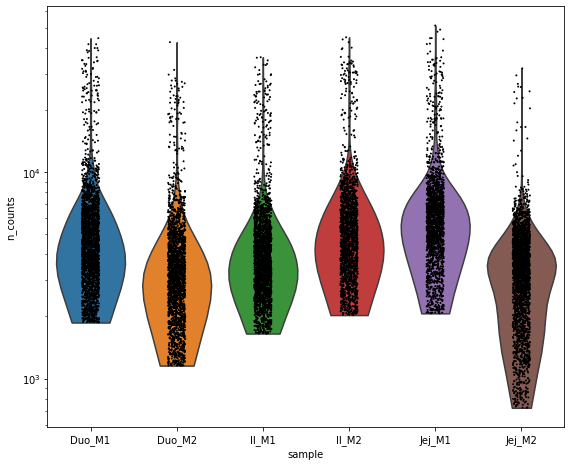

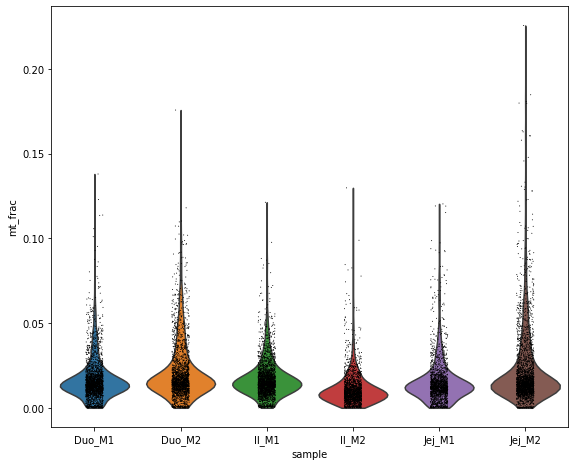

In [6]:
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

mt_gene_mask = [gene.startswith('mt-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1) / adata.obs['n_counts']
# number of UMI counts
t1 = sc.pl.violin(adata, 'n_counts', groupby='sample', size=2, log=True, cut=0)
# fraction of counts that are mitochondrial
t2 = sc.pl.violin(adata, 'mt_frac', groupby='sample')

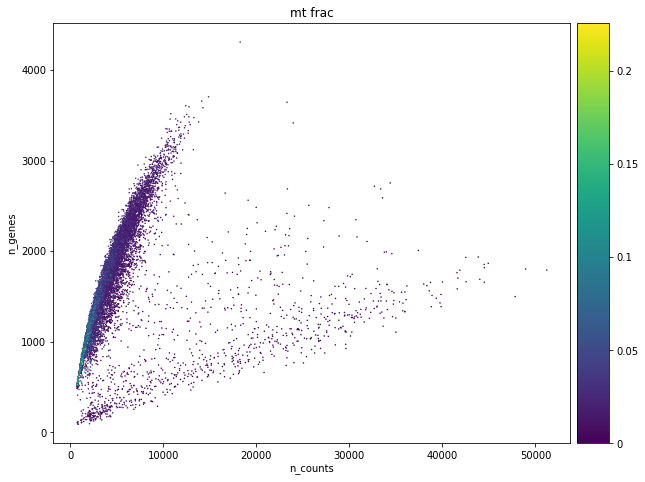

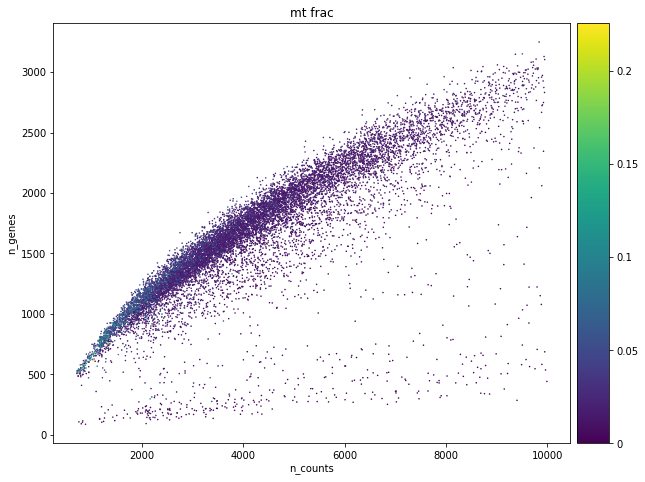

In [7]:
p1 = sc.pl.scatter(adata, 'n_counts', "n_genes", color='mt_frac')
p2 = sc.pl.scatter(adata[adata.obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac')

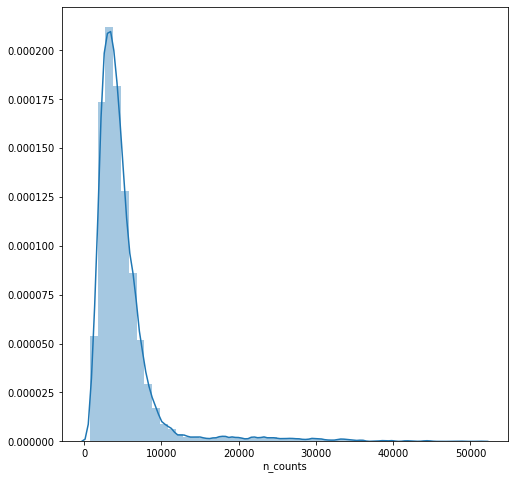

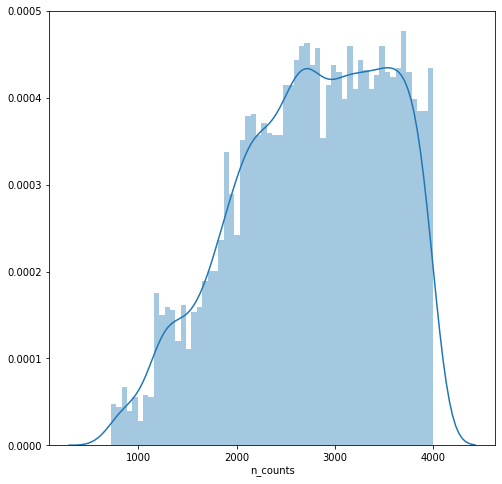

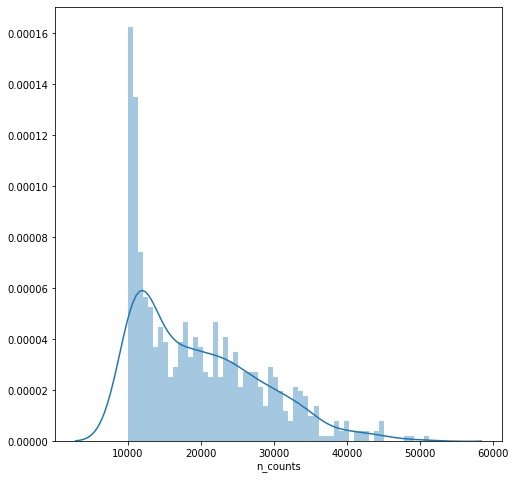

In [8]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=True)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<4000], kde=True, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>10000], kde=True, bins=60)
plt.show()

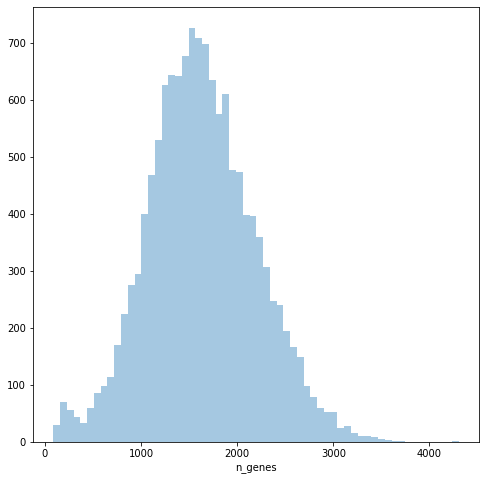

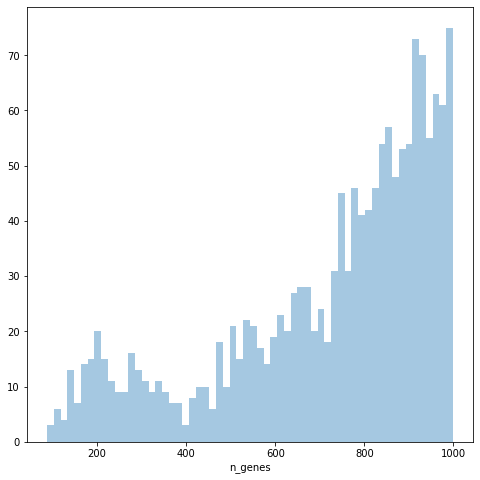

In [9]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes']<1000], kde=False, bins=60)
plt.show()

In [10]:
sc.pp.filter_cells(adata, min_counts=1500)
sc.pp.filter_cells(adata, max_counts = 40000)
adata = adata[adata.obs["mt_frac"] < 0.2]
sc.pp.filter_cells(adata, min_genes = 700)
# Filter genes:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=20)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

filtered out 479 cells that have less than 1500 counts
filtered out 16 cells that have more than 40000 counts
filtered out 401 cells that have less than 700 genes expressed


Trying to set attribute `.obs` of view, copying.


Total number of genes: 27998
filtered out 15180 genes that are detected in less than 20 cells
Number of genes after cell filter: 12818


## 2.2 **Normalization**

In [11]:
adata_pp = adata.copy()
sc.pp.normalize_per_cell(adata_pp, counts_per_cell_after=1e6)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.louvain(adata_pp, key_added='groups', resolution=0.5)

normalizing by total count per cell
    finished (0:00:01): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
computing PCA with n_comps = 15
    finished (0:00:06)
computing neighbors
    using 'X_pca' with n_pcs = 15


/Users/xly/miniconda3/envs/tf/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../miniconda3/envs/tf/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/Users/xly/miniconda3/envs/tf/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../miniconda3/envs/tf/lib/python3

    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:08)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 10 clusters and added
    'groups', the cluster labels (adata.obs, categorical) (0:00:03)


In [12]:
input_groups = adata_pp.obs['groups']
data_mat = adata.X.T

In [13]:
%%R -i data_mat -i input_groups -o size_factors
size_factors = computeSumFactors(data_mat, clusters=input_groups, min.mean=0.1)

In [14]:
del adata_pp

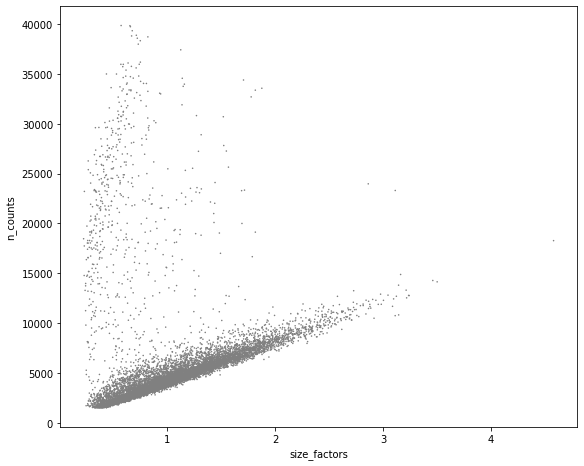

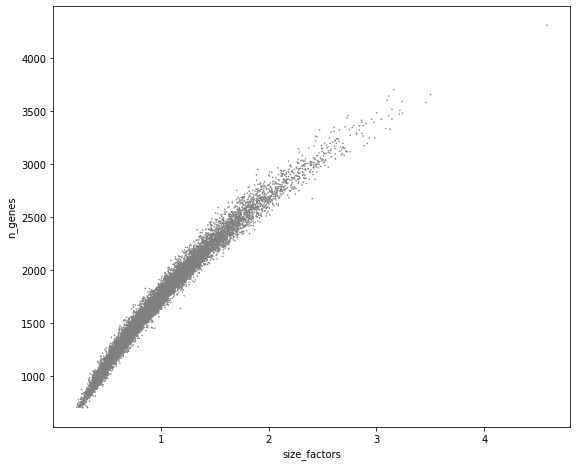

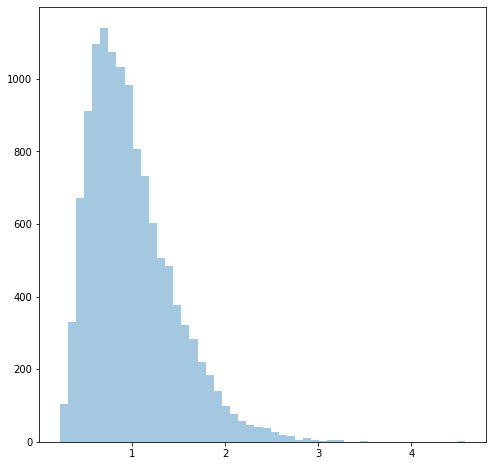

In [15]:
# Visualize the estimated size factors
adata.obs['size_factors'] = size_factors

sc.pl.scatter(adata, 'size_factors', 'n_counts')
sc.pl.scatter(adata, 'size_factors', 'n_genes')

sb.distplot(size_factors, bins=50, kde=False)
plt.show()

In [16]:
adata.layers['counts'] = adata.X.copy()
adata.X /= adata.obs['size_factors'].values[:, None]
sc.pp.log1p(adata)

In [17]:
adata.raw = adata

## 2.3 **Batch Correction**

To make downstream analysis faster on personal computer, use **sub-sampled** dataset.

In [18]:
adata_combat = adata.copy()
# sub-sampled dataset is 1/4 of the original one
sc.pp.subsample(adata_combat, fraction=0.5, random_state=0, copy=False)
sc.pp.subsample(adata_combat, fraction=0.5, random_state=0, copy=False)
# adata_orig is used in the following step
adata_orig = adata_combat.copy()
sc.pp.combat(adata_combat, key='sample')
adata_combat.shape

Standardizing Data across genes.

Found 6 batches

Found 0 numerical variables:
	

Found 1 genes with zero variance.
Fitting L/S model and finding priors

Finding parametric adjustments



/Users/xly/miniconda3/envs/tf/lib/python3.7/site-packages/scanpy/preprocessing/_combat.py:338: RuntimeWarning: divide by zero encountered in true_divide
  change = max((abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max())
/Users/xly/miniconda3/envs/tf/lib/python3.7/site-packages/scanpy/preprocessing/_combat.py:338: RuntimeWarning: invalid value encountered in true_divide
  change = max((abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max())


Adjusting data



(3114, 12818)

## 2.4 **Highly Variable Genes**

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 3999


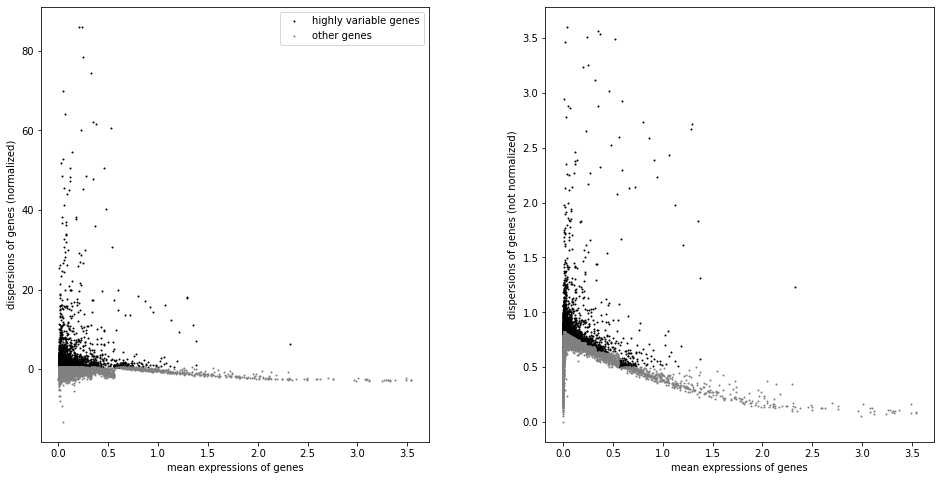

In [19]:
sc.pp.highly_variable_genes(adata_combat, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata_combat.var['highly_variable'])))
sc.pl.highly_variable_genes(adata_combat)

## 2.5 Visualization

In [20]:
sc.pp.pca(adata_combat, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata_combat)

sc.tl.tsne(adata_combat, n_jobs=1) 
sc.tl.umap(adata_combat)
sc.tl.diffmap(adata_combat)
sc.tl.draw_graph(adata_combat)

    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:04)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:26)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99428535 0.99007505 0.98960084 0.98788553 0.9841139
     0.95536435 0.94784397 0.9466441  0.93957824 0.9331714  0.92721856
     0.92398    0.90229857 0.89579207]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (

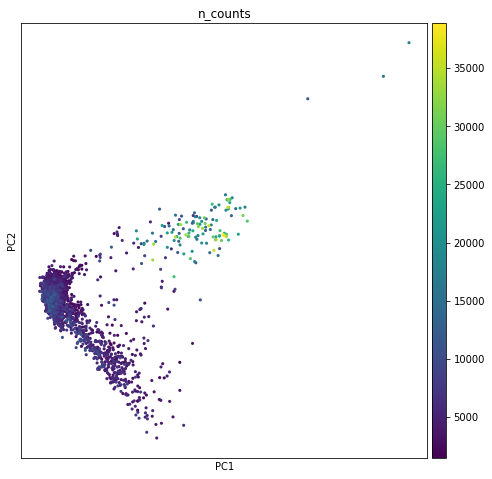

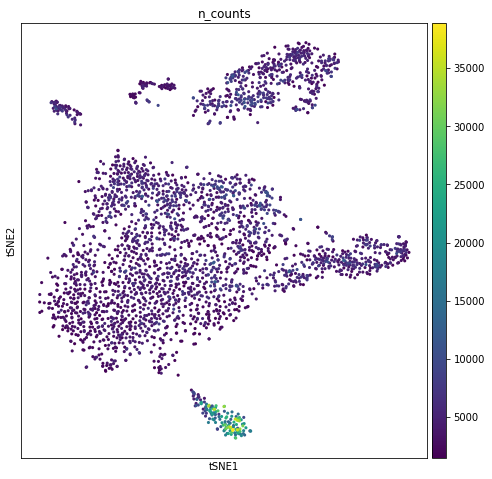

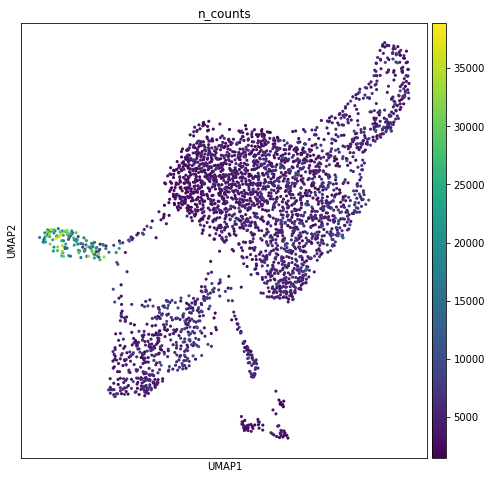

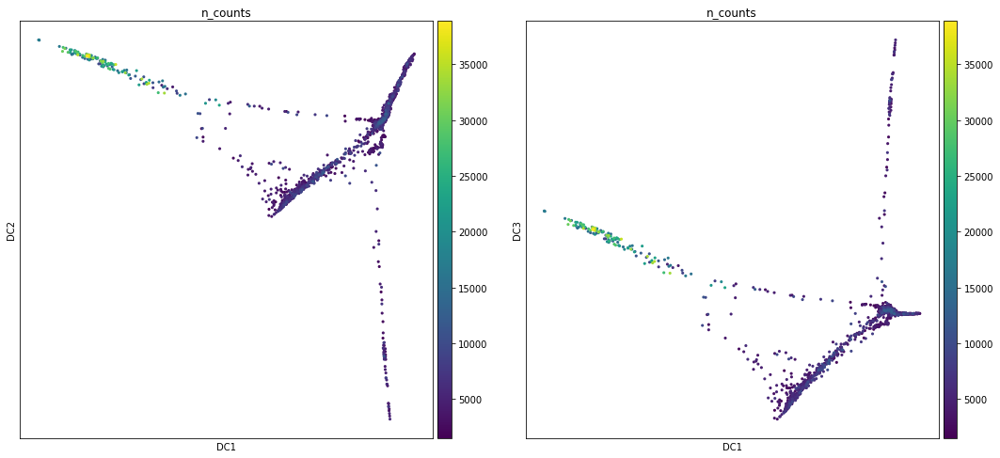

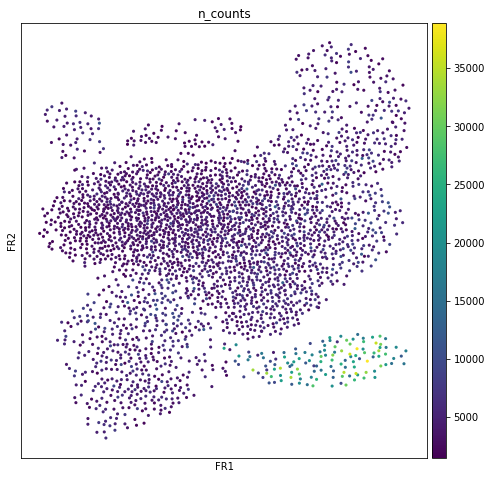

In [21]:
sc.pl.pca_scatter(adata_combat, color='n_counts')
sc.pl.tsne(adata_combat, color='n_counts')
sc.pl.umap(adata_combat, color='n_counts')
sc.pl.diffmap(adata_combat, color='n_counts', components=['1,2','1,3'])
sc.pl.draw_graph(adata_combat, color='n_counts')

### Plot tSNE and UMAP before and after batch correction ##

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 3999


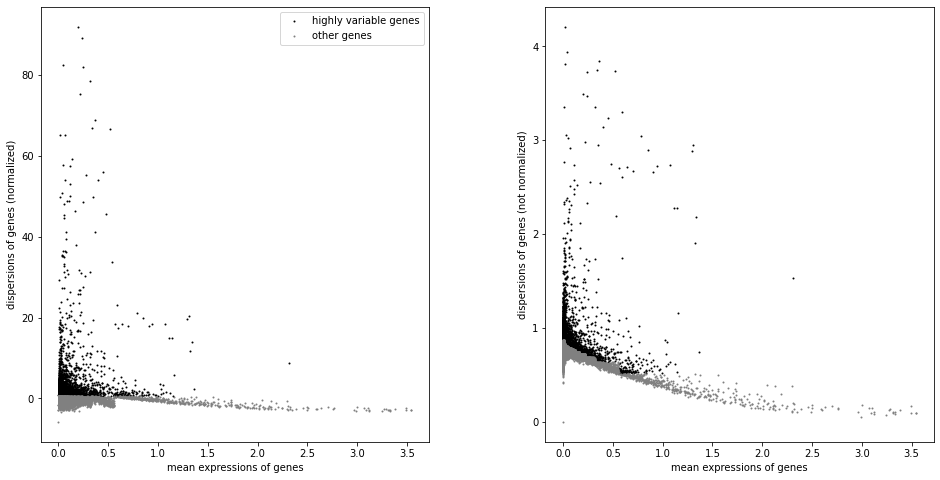

    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE with a fix by D. DeTomaso
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:26)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


In [22]:
# use adata_orig which is before batch correction
sc.pp.highly_variable_genes(adata_orig, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata_orig.var['highly_variable'])))
sc.pl.highly_variable_genes(adata_orig)

sc.pp.pca(adata_orig, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata_orig)

sc.tl.tsne(adata_orig, n_jobs=1) 
sc.tl.umap(adata_orig)

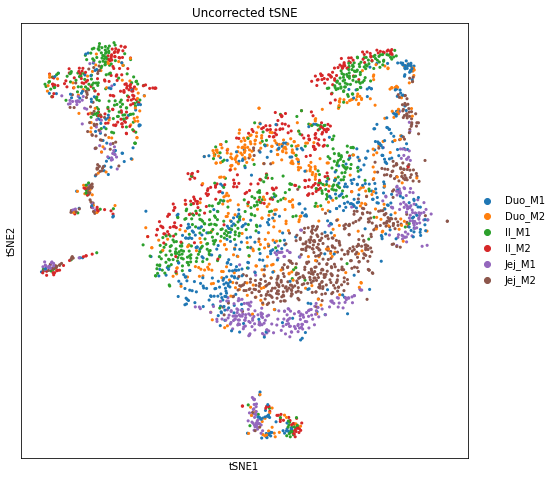

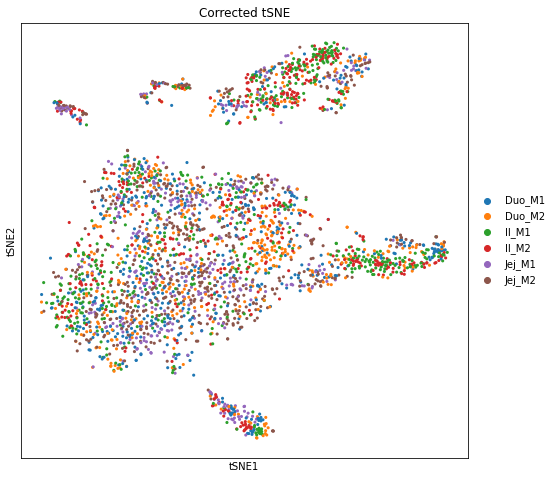

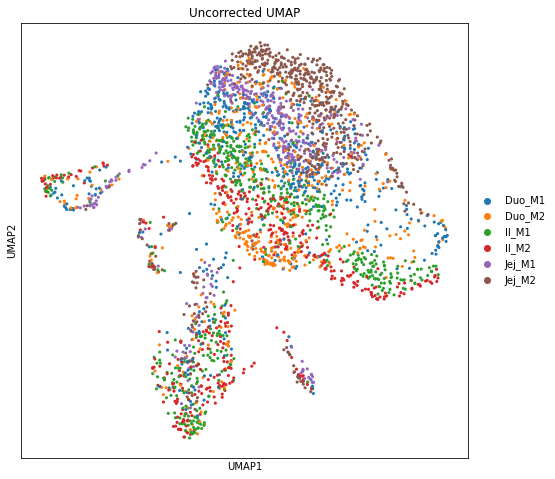

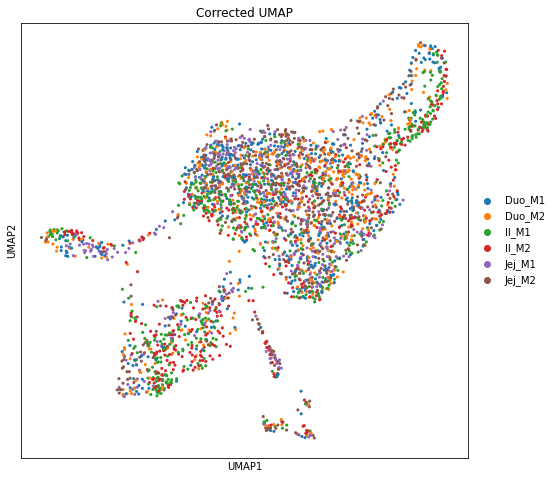

In [23]:
sc.pl.tsne(adata_orig, color="sample", title="Uncorrected tSNE")
sc.pl.tsne(adata_combat, color="sample", title="Corrected tSNE")
sc.pl.umap(adata_orig, color="sample", title="Uncorrected UMAP")
sc.pl.umap(adata_combat, color="sample", title="Corrected UMAP")

As can be seen, cells are more mixed after batch correction.

## 2.6 Cell cycle scoring

In [24]:
#Score cell cycle and visualize the effect:
cc_genes = pd.read_table(cc_genes_file, delimiter='\t')
s_genes = cc_genes['S'].dropna()
g2m_genes = cc_genes['G2.M'].dropna()

s_genes_mm = [gene.lower().capitalize() for gene in s_genes]
g2m_genes_mm = [gene.lower().capitalize() for gene in g2m_genes]
s_genes_mm_ens = adata_combat.var_names[np.in1d(adata_combat.var_names, s_genes_mm)]
g2m_genes_mm_ens = adata_combat.var_names[np.in1d(adata_combat.var_names, g2m_genes_mm)]
sc.tl.score_genes_cell_cycle(adata_combat, s_genes=s_genes_mm_ens, g2m_genes=g2m_genes_mm_ens)

calculating cell cycle phase
computing score 'S_score'


/Users/xly/miniconda3/envs/tf/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: read_table is deprecated, use read_csv instead.
  


    finished: added
    'S_score', score of gene set (adata.obs) (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs) (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


... storing 'phase' as categorical


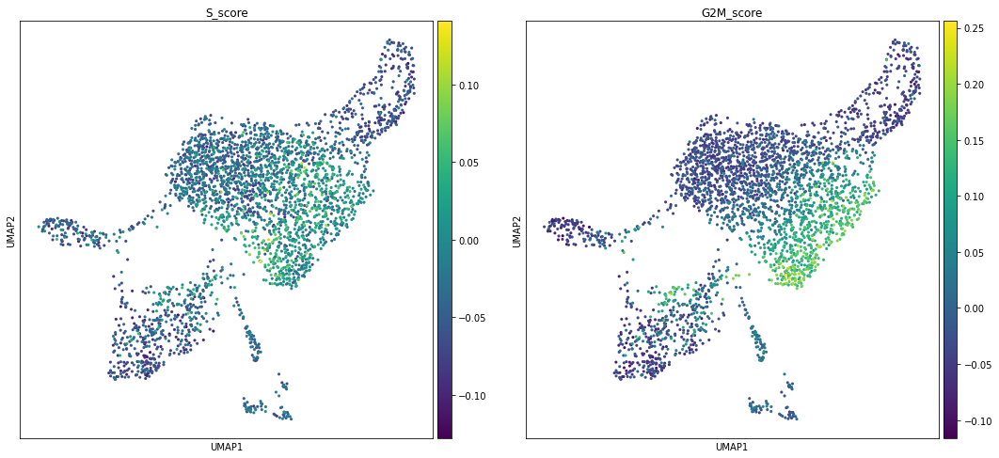

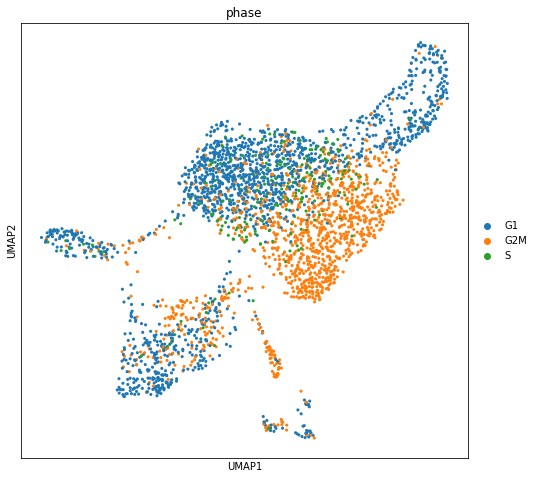

In [25]:
sc.pl.umap(adata_combat, color=['S_score', 'G2M_score'], use_raw=False)
sc.pl.umap(adata_combat, color='phase', use_raw=False)

# 3 Downstream analysis

## 3.1 Clustering

To make results in sub-sampled dataset comparable to original dataset, use resolution=0.65 in Louvain so that there are still 9 clusters.

In [26]:
sc.tl.louvain(adata_combat, key_added='louvain_r1', random_state=10)
sc.tl.louvain(adata_combat, resolution=0.65, key_added='louvain_r0.65', random_state=10)
adata_combat.obs['louvain_r0.65'].value_counts()

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 10 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 9 clusters and added
    'louvain_r0.65', the cluster labels (adata.obs, categorical) (0:00:00)


0    674
1    600
2    581
3    469
4    345
5    171
6    150
7     65
8     59
Name: louvain_r0.65, dtype: int64

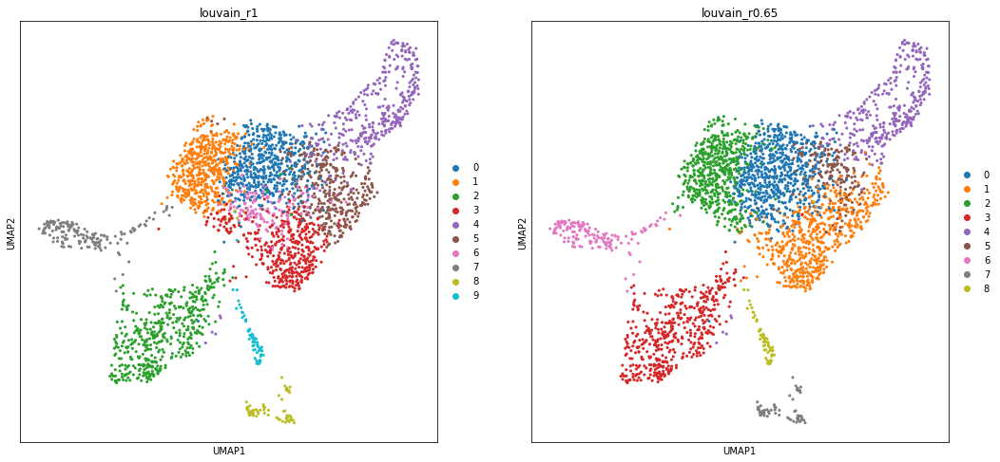

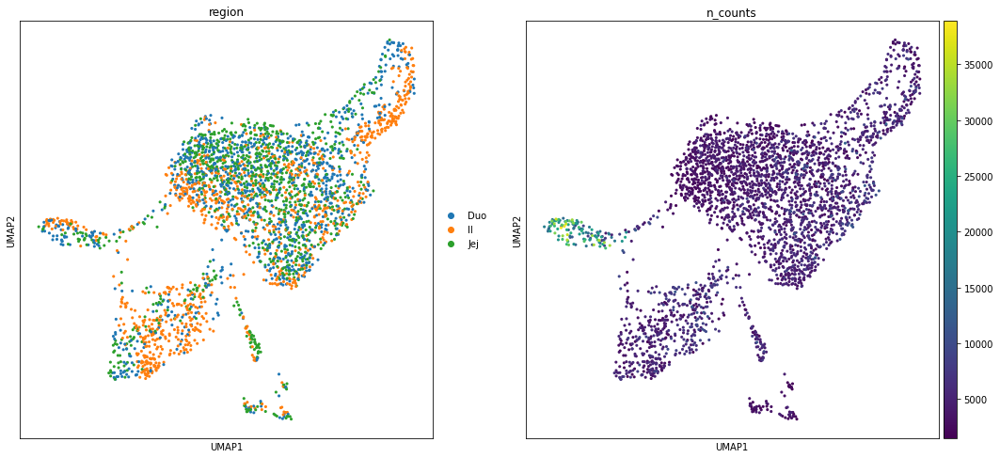

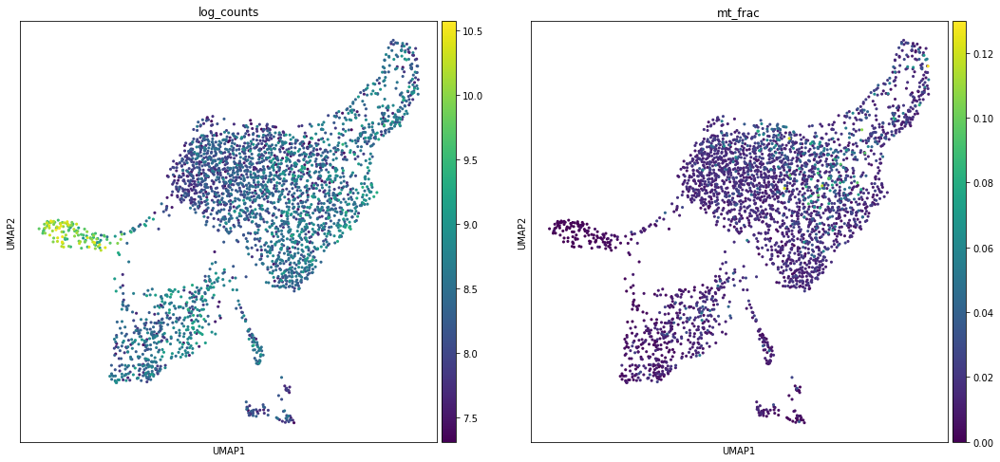

In [27]:
sc.pl.umap(adata_combat, color=['louvain_r1', 'louvain_r0.65'])
sc.pl.umap(adata_combat, color=['region', 'n_counts'])
sc.pl.umap(adata_combat, color=['log_counts', 'mt_frac'])

## 3.2 Marker genes and cluster annotation

ranking genes
    finished: added to `.uns['rank_genes_r0.65']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


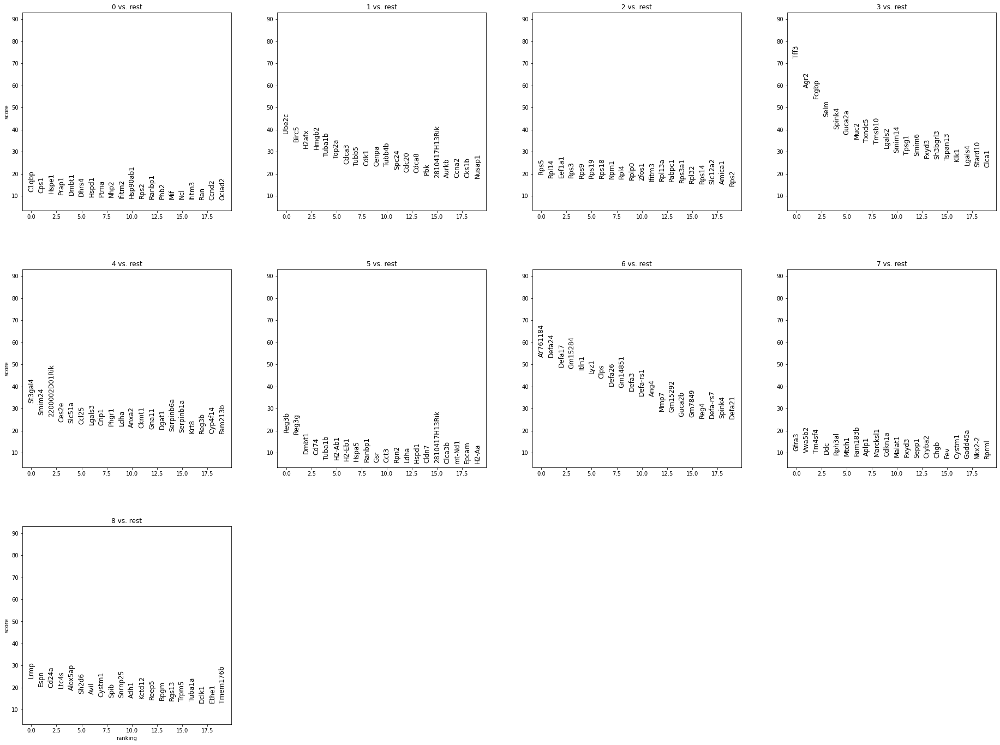

In [28]:
sc.tl.rank_genes_groups(adata_combat, groupby='louvain_r0.65', key_added='rank_genes_r0.65')
sc.pl.rank_genes_groups(adata_combat, key='rank_genes_r0.65', \
                        groups=['0','1','2','3','4','5','6','7','8'], fontsize=12)

Note that the cluster numbers here are different from the numbers in the original notebook. Marker genes in each cluster are also not exactly the same.

In [29]:
#Known marker genes:
marker_genes = dict()
marker_genes['Stem'] = ['Lgr5', 'Ascl2', 'Slc12a2', 'Axin2', 'Olfm4', 'Gkn3']
marker_genes['Enterocyte (Proximal)'] = ['Gsta1','Rbp2','Adh6a','Apoa4','Reg3a','Creb3l3','Cyp3a13','Cyp2d26','Ms4a10','Ace','Aldh1a1','Rdh7','H2-Q2', 'Hsd17b6','Gstm3','Gda','Apoc3','Gpd1','Fabp1','Slc5a1','Mme','Cox7a1','Gsta4','Lct','Khk','Mttp','Xdh','Sult1b1', 'Treh','Lpgat1','Dhrs1','Cyp2c66','Ephx2','Cyp2c65','Cyp3a25','Slc2a2','Ugdh','Gstm6','Retsat','Ppap2a','Acsl5', 'Cyb5r3','Cyb5b','Ckmt1','Aldob','Ckb','Scp2','Prap1']
marker_genes['Enterocyte (Distal)'] = ['Tmigd1','Fabp6','Slc51b','Slc51a','Mep1a','Fam151a','Naaladl1','Slc34a2','Plb1','Nudt4','Dpep1','Pmp22','Xpnpep2','Muc3','Neu1','Clec2h','Phgr1','2200002D01Rik','Prss30','Cubn','Plec','Fgf15','Crip1','Krt20','Dhcr24','Myo15b','Amn','Enpep','Anpep','Slc7a9','Ocm','Anxa2','Aoc1','Ceacam20','Arf6','Abcb1a','Xpnpep1','Vnn1','Cndp2','Nostrin','Slc13a1','Aspa','Maf','Myh14']
marker_genes['Goblet'] = ['Agr2', 'Fcgbp', 'Tff3', 'Clca1', 'Zg16', 'Tpsg1', 'Muc2', 'Galnt12', 'Atoh1', 'Rep15', 'S100a6', 'Pdia5', 'Klk1', 'Pla2g10', 'Spdef', 'Lrrc26', 'Ccl9', 'Bace2', 'Bcas1', 'Slc12a8', 'Smim14', 'Tspan13', 'Txndc5', 'Creb3l4', 'C1galt1c1', 'Creb3l1', 'Qsox1', 'Guca2a', 'Scin', 'Ern2', 'AW112010', 'Fkbp11', 'Capn9', 'Stard3nl', 'Slc50a1', 'Sdf2l1', 'Hgfa', 'Galnt7', 'Hpd', 'Ttc39a', 'Tmed3', 'Pdia6', 'Uap1', 'Gcnt3', 'Tnfaip8', 'Dnajc10', 'Ergic1', 'Tsta3', 'Kdelr3', 'Foxa3', 'Tpd52', 'Tmed9', 'Spink4', 'Nans', 'Cmtm7', 'Creld2', 'Tm9sf3', 'Wars', 'Smim6', 'Manf', 'Oit1', 'Tram1', 'Kdelr2', 'Xbp1', 'Serp1', 'Vimp', 'Guk1', 'Sh3bgrl3', 'Cmpk1', 'Tmsb10', 'Dap', 'Ostc', 'Ssr4', 'Sec61b', 'Pdia3', 'Gale', 'Klf4', 'Krtcap2', 'Arf4', 'Sep15', 'Ssr2', 'Ramp1', 'Calr', 'Ddost']
marker_genes['Paneth'] = ['Gm15284', 'AY761184', 'Defa17', 'Gm14851', 'Defa22', 'Defa-rs1', 'Defa3', 'Defa24', 'Defa26', 'Defa21', 'Lyz1', 'Gm15292', 'Mptx2', 'Ang4']
marker_genes['Enteroendocrine'] = ['Chgb', 'Gfra3', 'Cck', 'Vwa5b2', 'Neurod1', 'Fev', 'Aplp1', 'Scgn', 'Neurog3', 'Resp18', 'Trp53i11', 'Bex2', 'Rph3al', 'Scg5', 'Pcsk1', 'Isl1', 'Maged1', 'Fabp5', 'Celf3', 'Pcsk1n', 'Fam183b', 'Prnp', 'Tac1', 'Gpx3', 'Cplx2', 'Nkx2-2', 'Olfm1', 'Vim', 'Rimbp2', 'Anxa6', 'Scg3', 'Ngfrap1', 'Insm1', 'Gng4', 'Pax6', 'Cnot6l', 'Cacna2d1', 'Tox3', 'Slc39a2', 'Riiad1']
marker_genes['Tuft'] = ['Alox5ap', 'Lrmp', 'Hck', 'Avil', 'Rgs13', 'Ltc4s', 'Trpm5', 'Dclk1', 'Spib', 'Fyb', 'Ptpn6', 'Matk', 'Snrnp25', 'Sh2d7', 'Ly6g6f', 'Kctd12', '1810046K07Rik', 'Hpgds', 'Tuba1a', 'Pik3r5', 'Vav1', 'Tspan6', 'Skap2', 'Pygl', 'Ccdc109b', 'Ccdc28b', 'Plcg2', 'Ly6g6d', 'Alox5', 'Pou2f3', 'Gng13', 'Bmx', 'Ptpn18', 'Nebl', 'Limd2', 'Pea15a', 'Tmem176a', 'Smpx', 'Itpr2', 'Il13ra1', 'Siglecf', 'Ffar3', 'Rac2', 'Hmx2', 'Bpgm', 'Inpp5j', 'Ptgs1', 'Aldh2', 'Pik3cg', 'Cd24a', 'Ethe1', 'Inpp5d', 'Krt23', 'Gprc5c', 'Reep5', 'Csk', 'Bcl2l14', 'Tmem141', 'Coprs', 'Tmem176b', '1110007C09Rik', 'Ildr1', 'Galk1', 'Zfp428', 'Rgs2', 'Inpp5b', 'Gnai2', 'Pla2g4a', 'Acot7', 'Rbm38', 'Gga2', 'Myo1b', 'Adh1', 'Bub3', 'Sec14l1', 'Asah1', 'Ppp3ca', 'Agt', 'Gimap1', 'Krt18', 'Pim3', '2210016L21Rik', 'Tmem9', 'Lima1', 'Fam221a', 'Nt5c3', 'Atp2a3', 'Mlip', 'Vdac3', 'Ccdc23', 'Tmem45b', 'Cd47', 'Lect2', 'Pla2g16', 'Mocs2', 'Arpc5', 'Ndufaf3']

cell_annotation = sc.tl.marker_gene_overlap(adata_combat, marker_genes, key='rank_genes_r0.65')
cell_annotation

,0,1,2,3,4,5,6,7,8
Stem,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0
Enterocyte (Proximal),1.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0
Enterocyte (Distal),0.0,0.0,0.0,1.0,17.0,0.0,0.0,1.0,0.0
Goblet,0.0,0.0,0.0,63.0,0.0,3.0,18.0,1.0,0.0
Paneth,0.0,0.0,0.0,0.0,0.0,0.0,14.0,0.0,0.0
Enteroendocrine,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31.0,0.0
Tuft,0.0,1.0,0.0,3.0,0.0,0.0,2.0,2.0,73.0


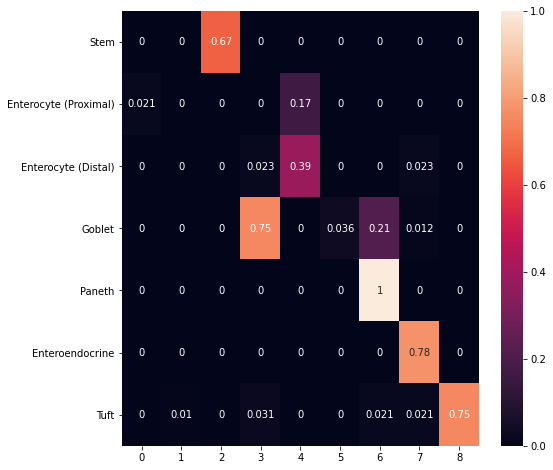

In [30]:
cell_annotation_norm = sc.tl.marker_gene_overlap(adata_combat, marker_genes, \
                                                 key='rank_genes_r0.65', \
                                                 normalize='reference')
sb.heatmap(cell_annotation_norm, cbar=True, annot=True)


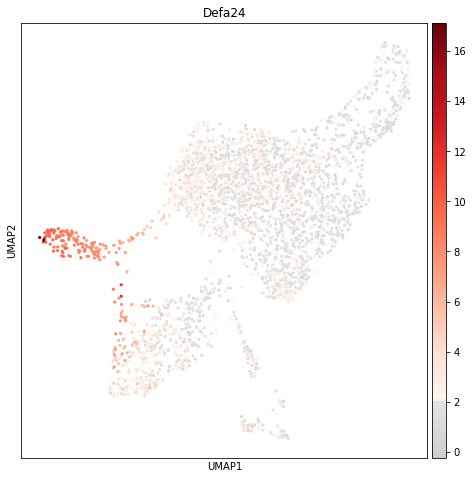

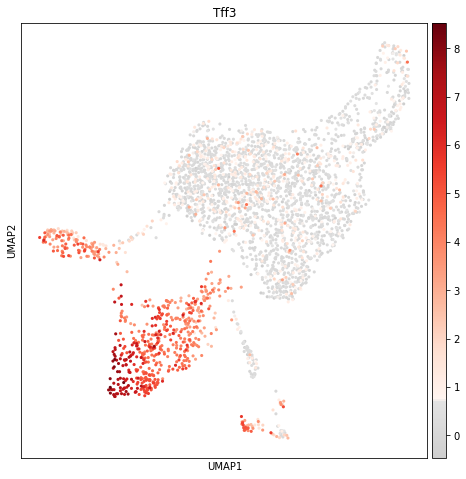

In [31]:
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7, 0.8, 20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
sc.pl.umap(adata_combat, color='Defa24', use_raw=False, color_map=mymap)
sc.pl.umap(adata_combat, color='Tff3', use_raw=False, color_map=mymap)

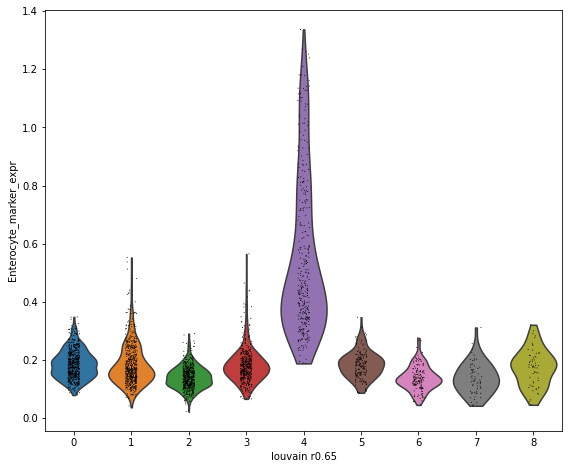

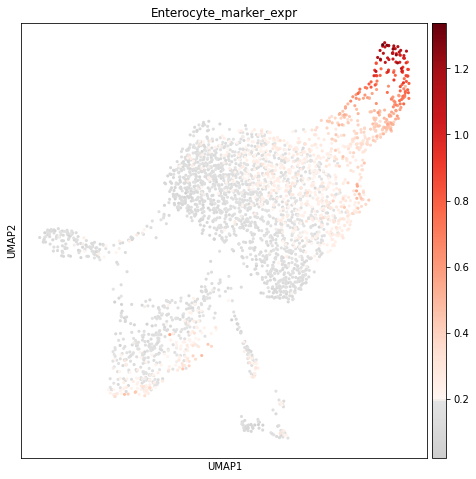

In [32]:
ids_entprox = np.in1d(adata_combat.var_names, marker_genes['Enterocyte (Proximal)'])
ids_entdist = np.in1d(adata_combat.var_names, marker_genes['Enterocyte (Distal)'])
ids_ent = np.logical_or(ids_entprox, ids_entdist)
adata_combat.obs['Enterocyte_marker_expr'] = adata_combat.X[:, ids_ent].mean(1)
sc.pl.violin(adata_combat, 'Enterocyte_marker_expr', groupby='louvain_r0.65')
sc.pl.umap(adata_combat, color='Enterocyte_marker_expr', color_map=mymap)

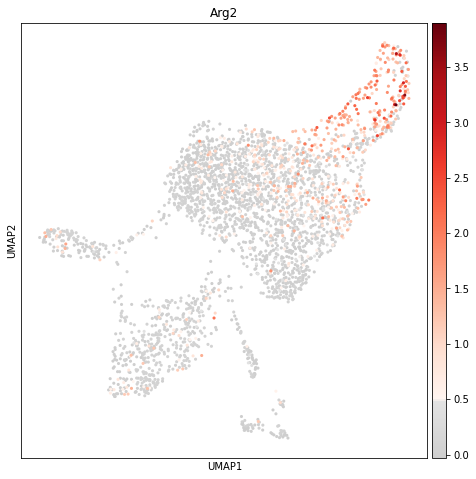

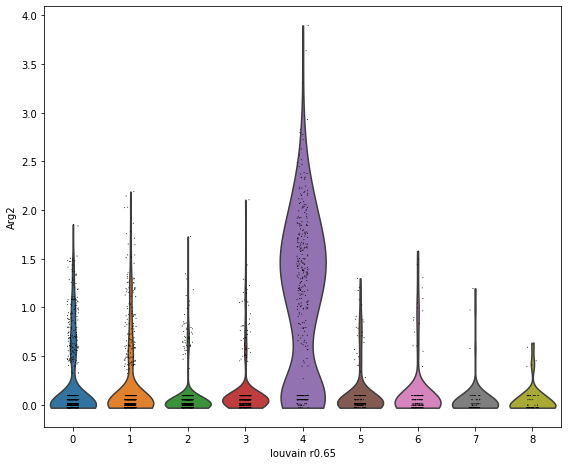

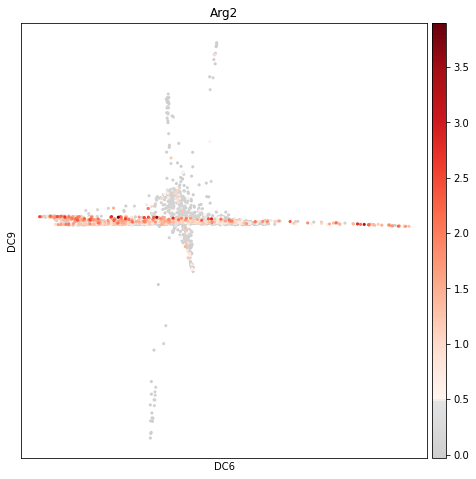

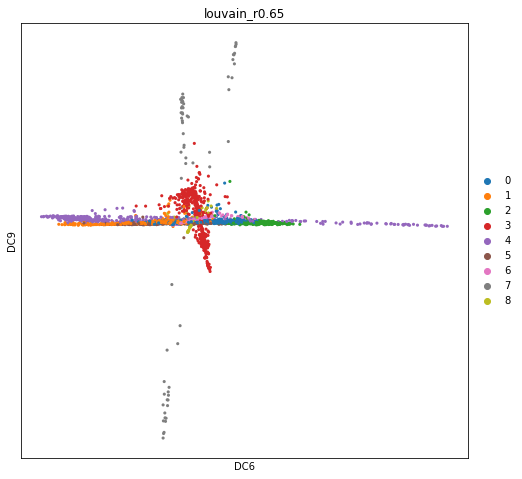

In [33]:
sc.pl.umap(adata_combat, color="Arg2", use_raw=False, color_map=mymap)
sc.pl.violin(adata_combat, groupby='louvain_r0.65', keys='Arg2', use_raw=False)
sc.pl.diffmap(adata_combat, components=['6,9'], color='Arg2', use_raw=False, color_map=mymap)
sc.pl.diffmap(adata_combat, components=['6,9'], color='louvain_r0.65')

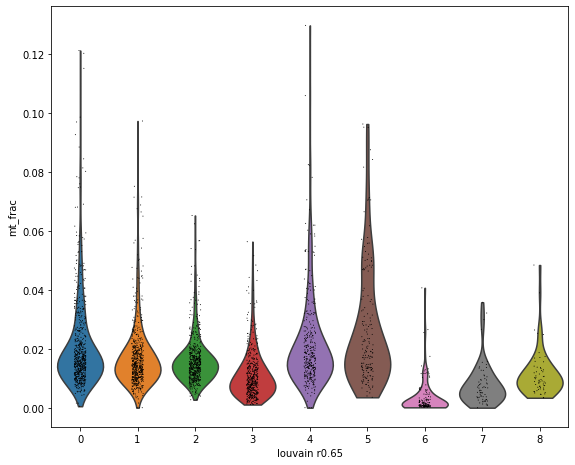

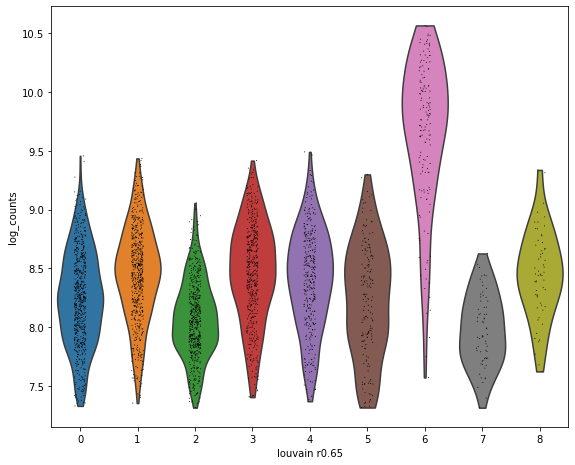

In [34]:
sc.pl.violin(adata_combat, 'mt_frac', groupby='louvain_r0.65')
sc.pl.violin(adata_combat, 'log_counts', groupby='louvain_r0.65')

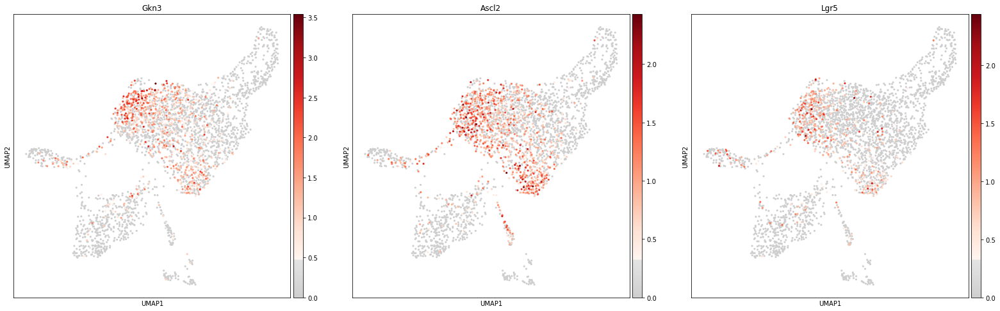

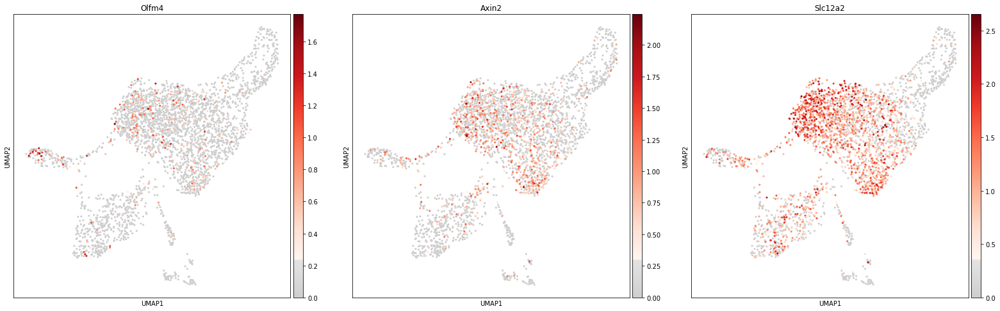

In [35]:
stem_genes = adata_combat.var_names[np.in1d(adata_combat.var_names, marker_genes['Stem'])]
sc.pl.umap(adata_combat, color=stem_genes[:3], title=stem_genes[:3], color_map=mymap)
sc.pl.umap(adata_combat, color=stem_genes[3:], title=stem_genes[3:], color_map=mymap)

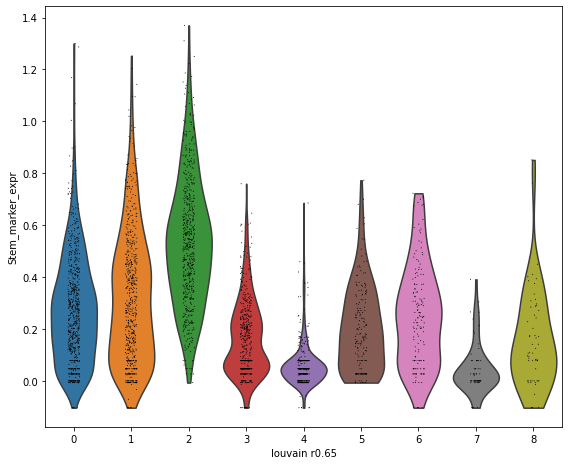

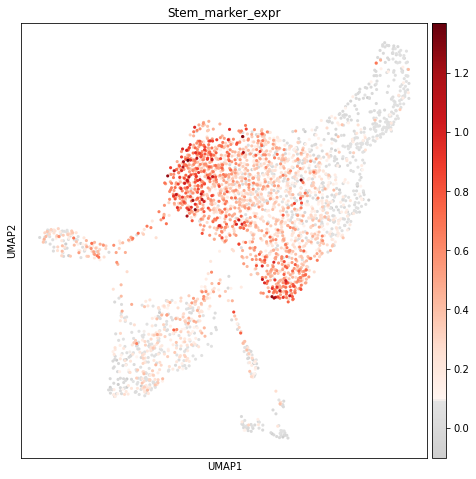

In [36]:
#Check stem marker expression
adata_combat.obs['Stem_marker_expr'] = adata_combat[:,stem_genes].X.mean(1)

sc.pl.violin(adata_combat, 'Stem_marker_expr', groupby='louvain_r0.65')
sc.pl.umap(adata_combat, color='Stem_marker_expr', color_map=mymap)

In [37]:
adata_combat.obs['louvain_r0.65'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8'], dtype='object')

Name each cluster:

In [38]:
adata_combat.rename_categories('louvain_r0.65', ['EP(early)', 'TA', 'Stem', 'Goblet', \
                                              'Enterocyte', 'EP (stress)', 'Paneth', \
                                              'Enteroendocrine', 'Tuft'])

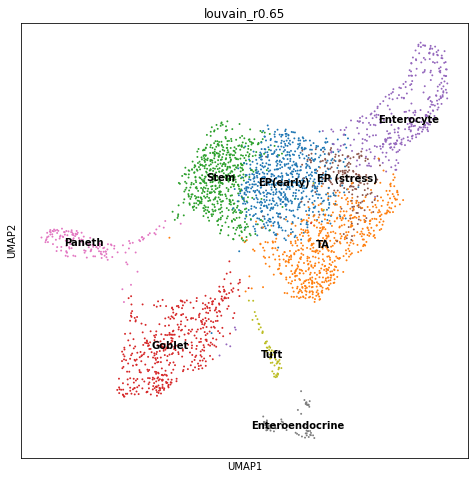

In [39]:
sc.pl.umap(adata_combat, color='louvain_r0.65', size=15, legend_loc='on data')

## 3.3 Subclustering

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 11 clusters and added
    'louvain_r0.65_entero_sub', the cluster labels (adata.obs, categorical) (0:00:00)


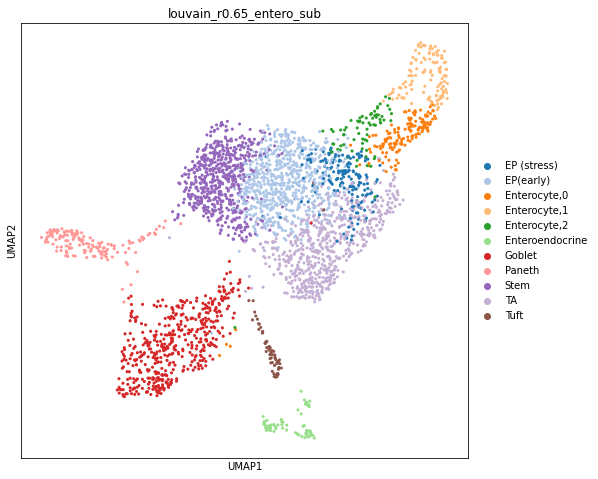

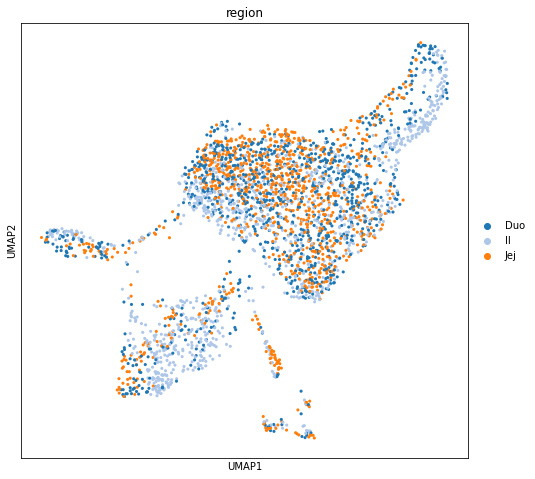

In [40]:
# use resolution=0.3 here
sc.tl.louvain(adata_combat, restrict_to=('louvain_r0.65', ['Enterocyte']), \
              resolution=0.3, key_added='louvain_r0.65_entero_sub')
sc.pl.umap(adata_combat, color='louvain_r0.65_entero_sub', palette=sc.pl.palettes.vega_20)
sc.pl.umap(adata_combat, color='region', palette=sc.pl.palettes.vega_20)

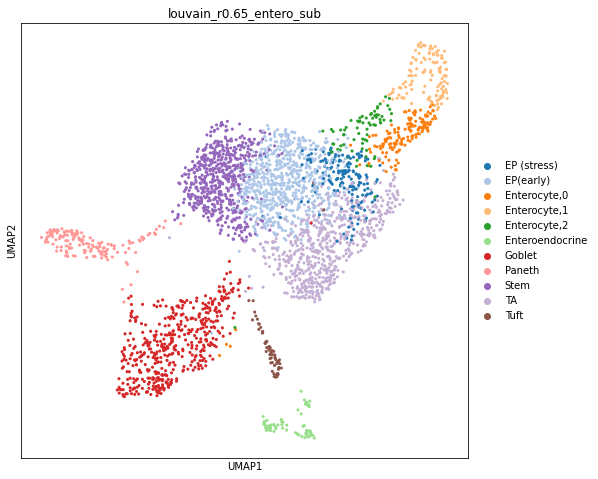

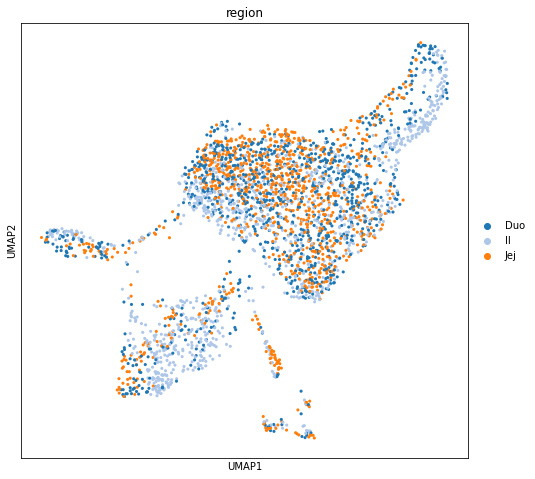

In [41]:
if 'louvain_r0.65_entero_sub_colors' in adata_combat.uns:
    del adata_combat.uns['louvain_r0.65_entero_sub_colors']
sc.pl.umap(adata_combat, color='louvain_r0.65_entero_sub', palette=sc.pl.palettes.vega_20)
sc.pl.umap(adata_combat, color='region', palette=sc.pl.palettes.vega_20)

ranking genes
    finished: added to `.uns['rank_genes_r0.65_entero_sub']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


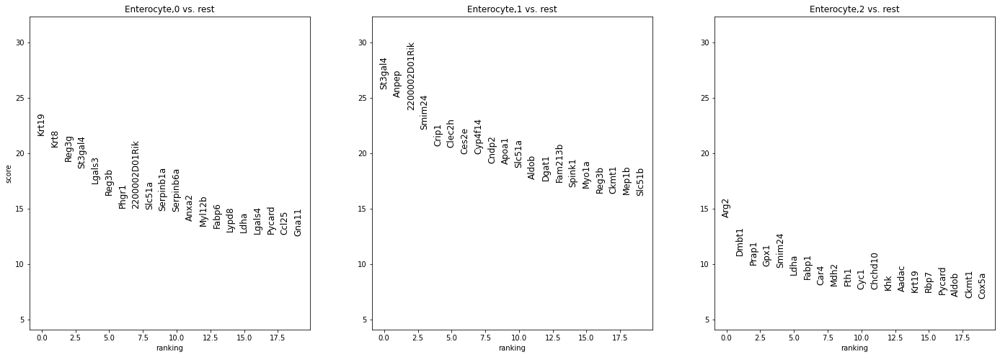

In [42]:
sc.tl.rank_genes_groups(adata_combat, groupby='louvain_r0.65_entero_sub', key_added='rank_genes_r0.65_entero_sub')
sc.pl.rank_genes_groups(adata_combat, key='rank_genes_r0.65_entero_sub', groups=['Enterocyte,0','Enterocyte,1', 'Enterocyte,2'], fontsize=12)

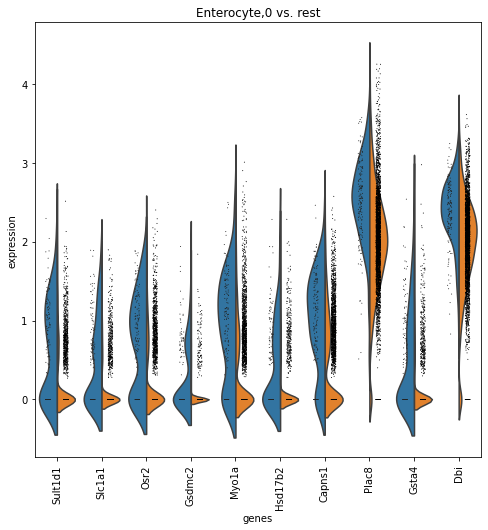

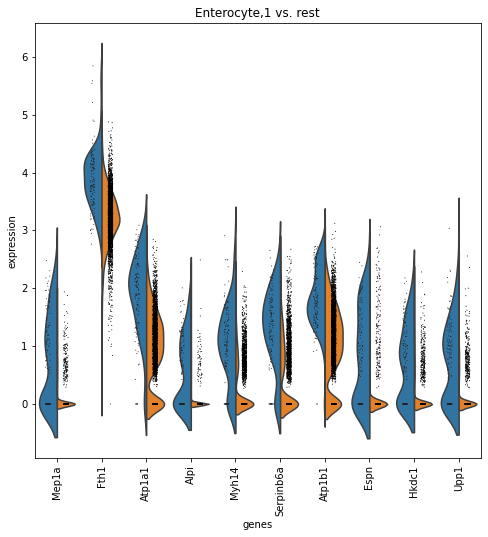

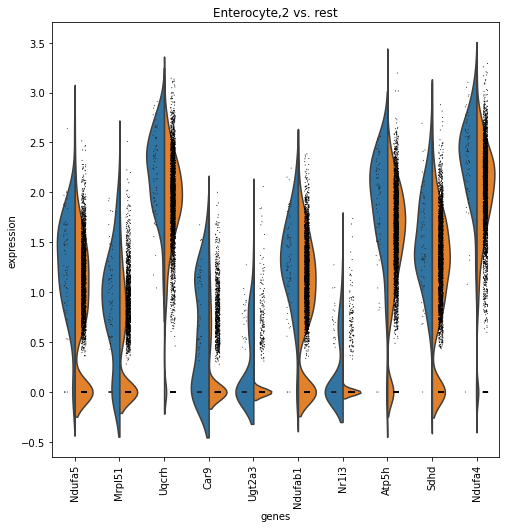

In [43]:
entero_clusts = [clust for clust in adata_combat.obs['louvain_r0.65_entero_sub'].cat.categories if clust.startswith('Enterocyte')]

for clust in entero_clusts:
    sc.pl.rank_genes_groups_violin(adata_combat, use_raw=True, key='rank_genes_r0.65_entero_sub', \
                                   groups=[clust], \
                                   gene_names=adata_combat.uns['rank_genes_r0.65_entero_sub']['names'][clust][90:100])

In [44]:
marker_genes_entero = {k: marker_genes[k] for k in marker_genes if k.startswith('Enterocyte')}

In [45]:
sc.tl.marker_gene_overlap(adata_combat, marker_genes_entero, key='rank_genes_r0.65_entero_sub', normalize='reference')

,EP (stress),EP(early),"Enterocyte,0","Enterocyte,1","Enterocyte,2",Enteroendocrine,Goblet,Paneth,Stem,TA,Tuft
Enterocyte (Proximal),0.0,0.020833,0.083333,0.270833,0.166667,0.000000,0.000000,0.0,0.0,0.0,0.0
Enterocyte (Distal),0.0,0.000000,0.318182,0.409091,0.068182,0.022727,0.022727,0.0,0.0,0.0,0.0


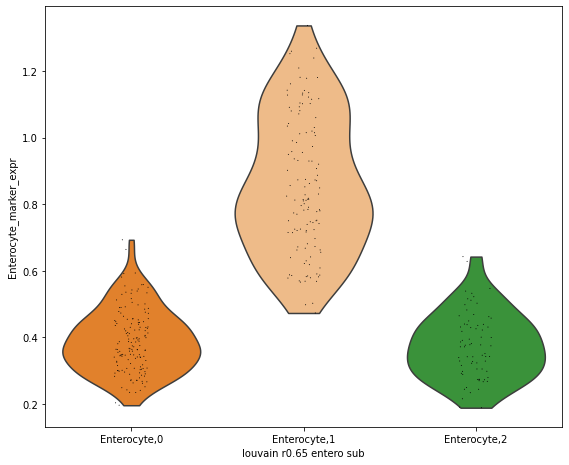

In [46]:
#Check enterocyte marker expression
sc.pl.violin(adata_combat[adata_combat.obs['louvain_r0.65']=='Enterocyte'], groupby='louvain_r0.65_entero_sub', keys='Enterocyte_marker_expr')

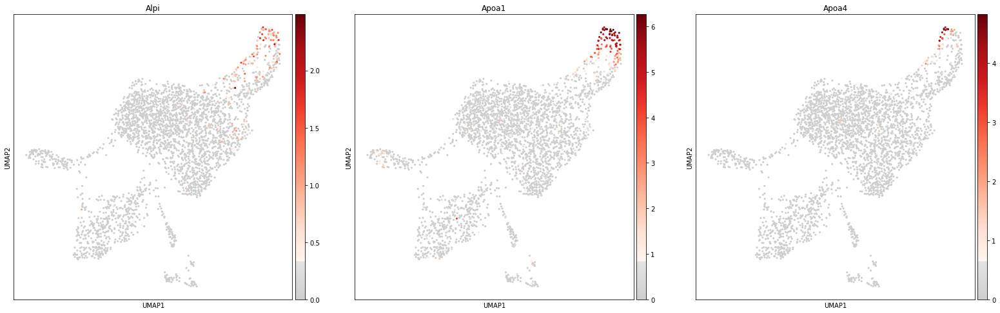

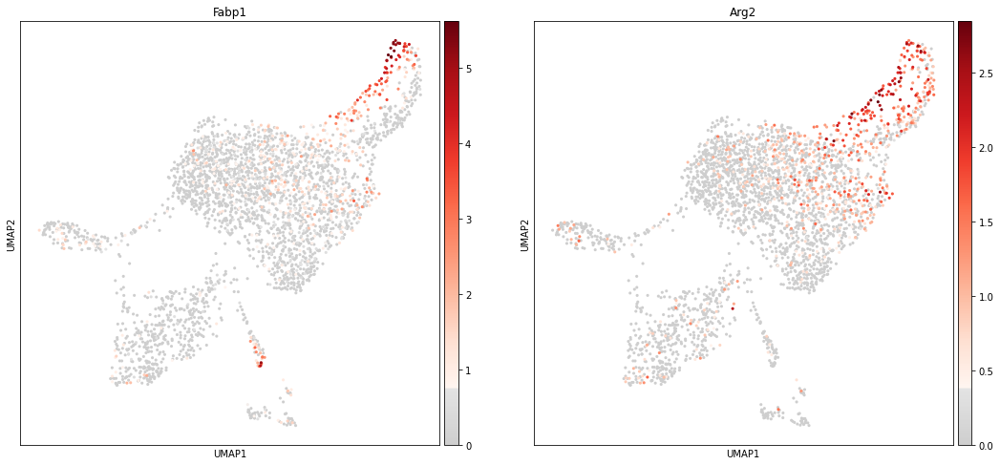

In [47]:
#Visualize some enterocyte markers
entero_genes = ['Alpi', 'Apoa1', 'Apoa4', 'Fabp1', 'Arg2']
sc.pl.umap(adata_combat, color=entero_genes[:3], title=entero_genes[:3], color_map=mymap)
sc.pl.umap(adata_combat, color=entero_genes[3:], title=entero_genes[3:], color_map=mymap)

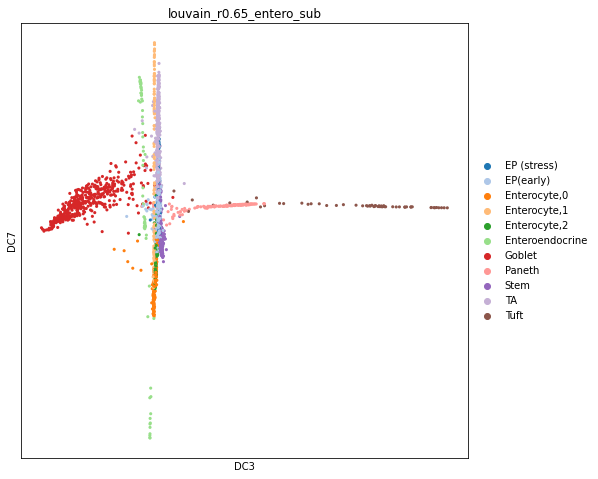

In [48]:
sc.pl.diffmap(adata_combat, color='louvain_r0.65_entero_sub', components='3,7')

In [49]:
tmp = adata_combat.obs['louvain_r0.65_entero_sub'].cat.categories

tmp = ['Enterocyte imm. (Distal)' if item == 'Enterocyte,0' else item for item in tmp]
tmp = ['Enterocyte imm. (Proximal)' if item == 'Enterocyte,2' else item for item in tmp]
tmp = ['Enterocyte mature' if item == 'Enterocyte,1' else item for item in tmp]

adata_combat.rename_categories('louvain_r0.65_entero_sub', tmp)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 12 clusters and added
    'louvain_r0.65_entero_mat_sub', the cluster labels (adata.obs, categorical) (0:00:00)


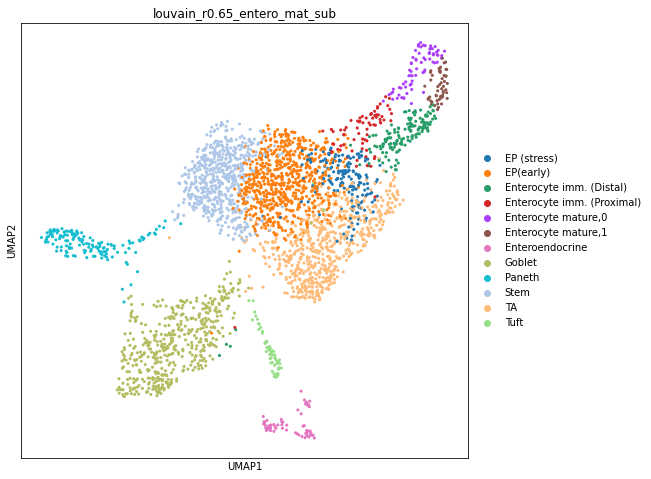

In [50]:
#Subcluster mature enterocytes
sc.tl.louvain(adata_combat, restrict_to=('louvain_r0.65_entero_sub', \
                                         ['Enterocyte mature']), resolution=0.25, \
              key_added='louvain_r0.65_entero_mat_sub')
#Show the new clustering
if 'louvain_r0.65_entero_mat_sub_colors' in adata_combat.uns:
    del adata_combat.uns['louvain_r0.65_entero_mat_sub_colors']

sc.pl.umap(adata_combat, color='louvain_r0.65_entero_mat_sub')

In [51]:
sc.tl.rank_genes_groups(adata_combat, groupby='louvain_r0.65_entero_mat_sub', key_added='rank_genes_r0.65_entero_mat_sub')

ranking genes
    finished: added to `.uns['rank_genes_r0.65_entero_mat_sub']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


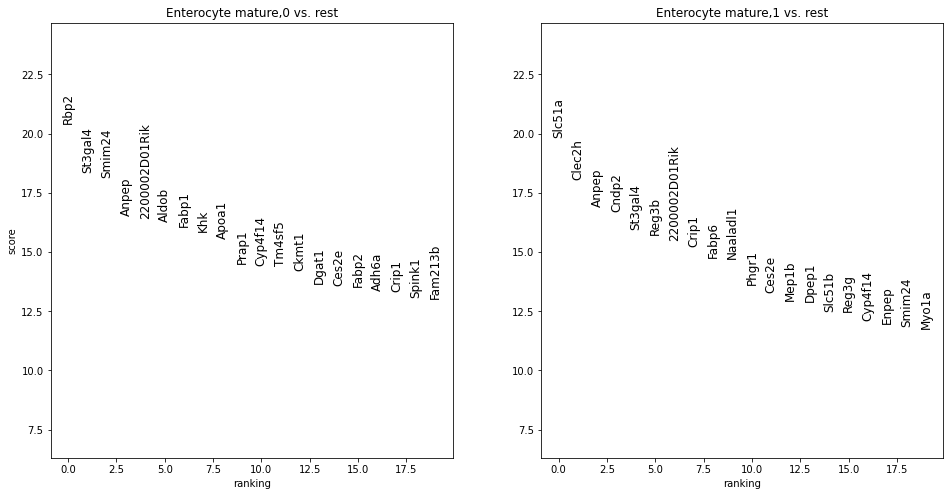

In [52]:
sc.pl.rank_genes_groups(adata_combat, key='rank_genes_r0.65_entero_mat_sub', groups=['Enterocyte mature,0','Enterocyte mature,1'], fontsize=12)

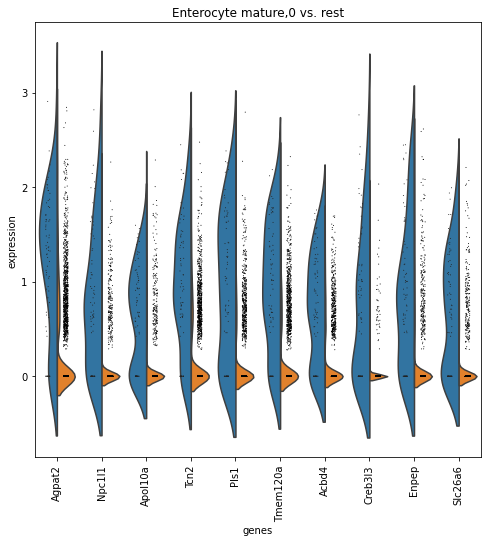

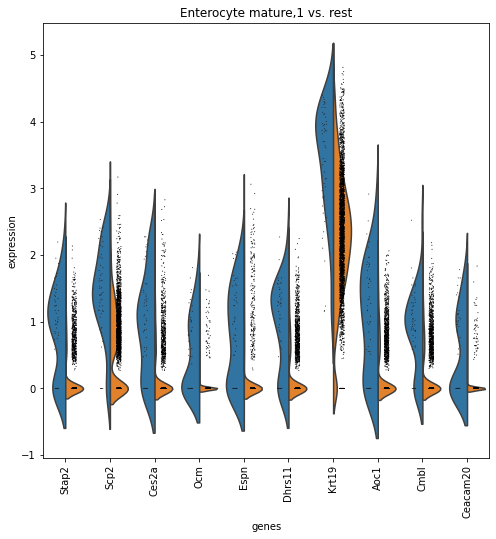

In [53]:
entero_mat_clusts = [clust for clust in adata_combat.obs['louvain_r0.65_entero_mat_sub'].cat.categories if clust.startswith('Enterocyte mature')]

for clust in entero_mat_clusts:
    sc.pl.rank_genes_groups_violin(adata_combat, use_raw=True, key='rank_genes_r0.65_entero_mat_sub', \
                                   groups=[clust], gene_names=adata_combat.uns['rank_genes_r0.65_entero_mat_sub']['names'][clust][90:100])

In [54]:
#Find marker overlap
sc.tl.marker_gene_overlap(adata_combat, marker_genes_entero, key='rank_genes_r0.65_entero_mat_sub', normalize='reference')

,EP (stress),EP(early),Enterocyte imm. (Distal),Enterocyte imm. (Proximal),"Enterocyte mature,0","Enterocyte mature,1",Enteroendocrine,Goblet,Paneth,Stem,TA,Tuft
Enterocyte (Proximal),0.0,0.020833,0.083333,0.166667,0.437500,0.145833,0.000000,0.000000,0.0,0.0,0.0,0.0
Enterocyte (Distal),0.0,0.000000,0.318182,0.068182,0.272727,0.522727,0.022727,0.022727,0.0,0.0,0.0,0.0


In [55]:
tmp = adata_combat.obs['louvain_r0.65_entero_mat_sub'].cat.categories

tmp = ['Enterocyte mat. (Distal)' if item == 'Enterocyte mature,1' else item for item in tmp]
tmp = ['Enterocyte mat. (Proximal)' if item == 'Enterocyte mature,0' else item for item in tmp]

adata_combat.rename_categories('louvain_r0.65_entero_mat_sub', tmp)

In [56]:
adata_combat.obs['louvain_final'] = adata_combat.obs['louvain_r0.65_entero_mat_sub']

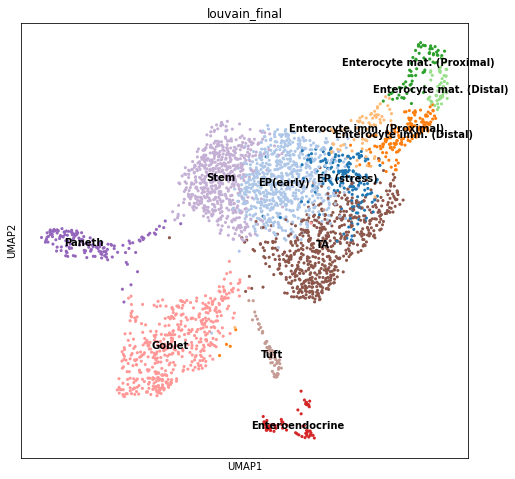

In [57]:
sc.pl.umap(adata_combat, color='louvain_final', palette=sc.pl.palettes.vega_20, legend_loc='on data')

In [58]:
adata_combat.obs['louvain_final'].value_counts()

EP(early)                     674
TA                            600
Stem                          581
Goblet                        469
EP (stress)                   171
Paneth                        150
Enterocyte imm. (Distal)      150
Enterocyte imm. (Proximal)     72
Enterocyte mat. (Proximal)     71
Enteroendocrine                65
Tuft                           59
Enterocyte mat. (Distal)       52
Name: louvain_final, dtype: int64

## 3.4 Compositional analysis

In [59]:
adata_combat.obs['prox_dist'] = ['Distal' if reg=='Il' else 'Proximal' for reg in adata_combat.obs['region']]
sc.tl.embedding_density(adata_combat, basis='umap', groupby='prox_dist')

... storing 'prox_dist' as categorical


computing density on 'umap'
--> added
    'umap_density_prox_dist', densities (adata.obs)
    'umap_density_prox_dist_params', parameter (adata.uns)


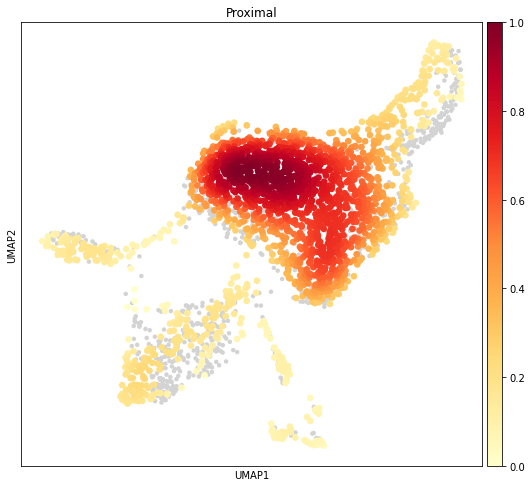

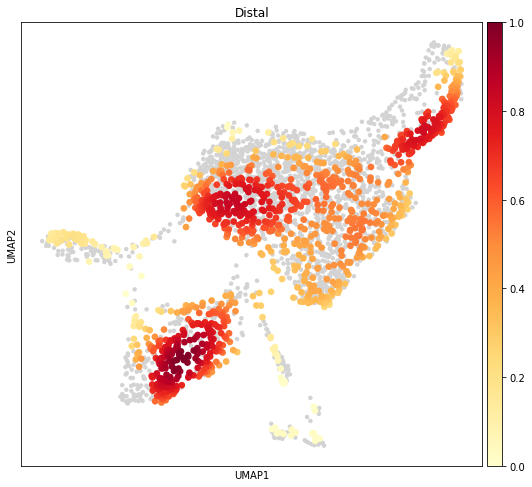

In [60]:
adata_combat.obs['prox_dist'].value_counts()
sc.pl.embedding_density(adata_combat, basis='umap', key='umap_density_prox_dist', group='Proximal')
sc.pl.embedding_density(adata_combat, basis='umap', key='umap_density_prox_dist', group='Distal')

# 3.5 Trajectory inference and pseudotime analysis

In [61]:
adata_combat.obs['louvain_final'].value_counts()

EP(early)                     674
TA                            600
Stem                          581
Goblet                        469
EP (stress)                   171
Paneth                        150
Enterocyte imm. (Distal)      150
Enterocyte imm. (Proximal)     72
Enterocyte mat. (Proximal)     71
Enteroendocrine                65
Tuft                           59
Enterocyte mat. (Distal)       52
Name: louvain_final, dtype: int64

In [62]:
#Subsetting to relevant clusters
clusters_to_include = [g for g in adata_combat.obs['louvain_final'].cat.categories if (g.startswith('Enterocyte') or g.startswith('TA') or g.startswith('Stem') or g.startswith('EP'))]
adata_ent = adata_combat[np.isin(adata_combat.obs['louvain_final'], clusters_to_include),:].copy()

#Subset to highly variable genes
sc.pp.highly_variable_genes(adata_ent, flavor='cell_ranger', n_top_genes=4000, subset=True)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:03)


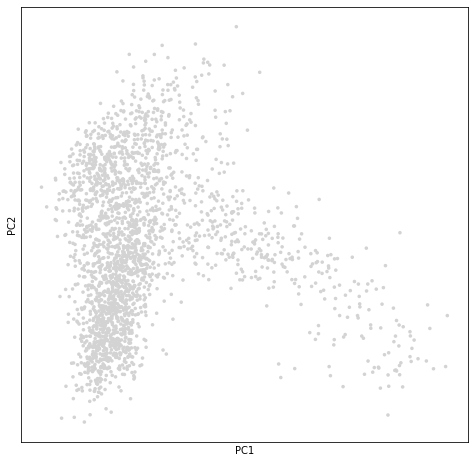

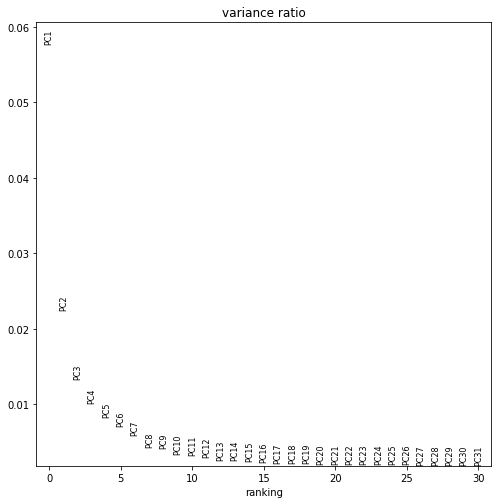

In [63]:
sc.pp.pca(adata_ent, svd_solver='arpack')
sc.pl.pca(adata_ent)
sc.pl.pca_variance_ratio(adata_ent)

In [64]:
adata_ent.obsm['X_pca'] = adata_ent.obsm['X_pca'][:, :7]

### **Consider only 1/4 of original dataset is used here, all the results below are not quite the same as those in the original notebook. The results are to be interpreted.**

### 3.5.1 Slingshot

/Users/xly/miniconda3/envs/tf/lib/python3.7/site-packages/anndata2ri/py2r.py:37: NotConvertedWarning: Conversion 'py2rpy' not defined for objects of type '<class 'NoneType'>'
  warn(str(e), NotConvertedWarning)


[1] "1:"
class: SlingshotDataSet 

 Samples Dimensions
    2371          7

lineages: 2 
Lineage1: Stem  EP(early)  Enterocyte imm. (Proximal)  Enterocyte imm. (Distal)  Enterocyte mat. (Distal)  Enterocyte mat. (Proximal)  
Lineage2: Stem  EP(early)  TA  EP (stress)  

curves: 2 
Curve1: Length: 37.087	Samples: 1531.4
Curve2: Length: 27.443	Samples: 1952.96
[1] ""
[1] "2:"
class: SlingshotDataSet 

 Samples Dimensions
    2371          7

lineages: 3 
Lineage1: Stem  EP(early)  Enterocyte imm. (Proximal)  Enterocyte imm. (Distal)  Enterocyte mat. (Proximal)  
Lineage2: Stem  EP(early)  Enterocyte imm. (Proximal)  Enterocyte imm. (Distal)  Enterocyte mat. (Distal)  
Lineage3: Stem  EP(early)  TA  EP (stress)  

curves: 3 
Curve1: Length: 35.756	Samples: 1477.03
Curve2: Length: 30.281	Samples: 1461.01
Curve3: Length: 27.324	Samples: 1949.01
[1] ""
[1] "3:"
class: SlingshotDataSet 

 Samples Dimensions
    2371          7

lineages: 2 
Lineage1: Stem  EP(early)  TA  EP (stress)  
Lineage

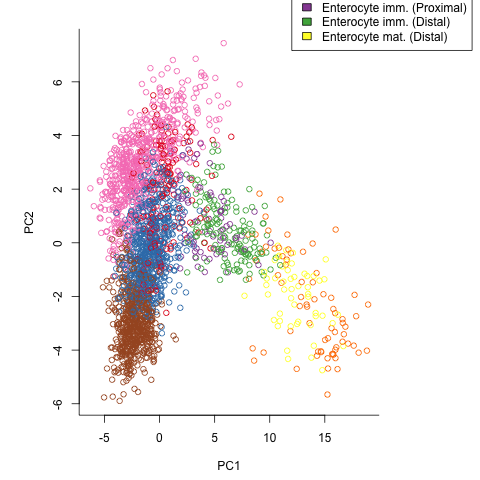

In [65]:
%%R -i adata_ent

#Plot 1
colour_map = brewer.pal(20,'Set1')
par(xpd=TRUE)
par(mar=c(4.5,5.5,2,7))
plot(reducedDims(adata_ent)$PCA[,1], reducedDims(adata_ent)$PCA[,2], col=colour_map[colData(adata_ent)$louvain_final], bty='L', xlab='PC1', ylab='PC2')
legend(x=12, y=12, legend=unique(colData(adata_ent)$louvain_final), fill=colour_map[as.integer(unique(colData(adata_ent)$louvain_final))])

print("1:")
adata_ent_start <- slingshot(adata_ent, clusterLabels = 'louvain_final', reducedDim = 'PCA', start.clus='Stem')
print(SlingshotDataSet(adata_ent_start))

print("")
print("2:")
adata_ent_startend <- slingshot(adata_ent, clusterLabels = 'louvain_final', reducedDim = 'PCA', start.clus='Stem', end.clus=c('Enterocyte mat. (Proximal)', 'Enterocyte mat. (Distal)'))
print(SlingshotDataSet(adata_ent_startend))

print("")
print("3:")
adata_ent_simple_startend <- slingshot(adata_ent, clusterLabels = 'louvain_r0.65', reducedDim = 'PCA', start.clus='Stem', end.clus='Enterocyte')
print(SlingshotDataSet(adata_ent_simple_startend))

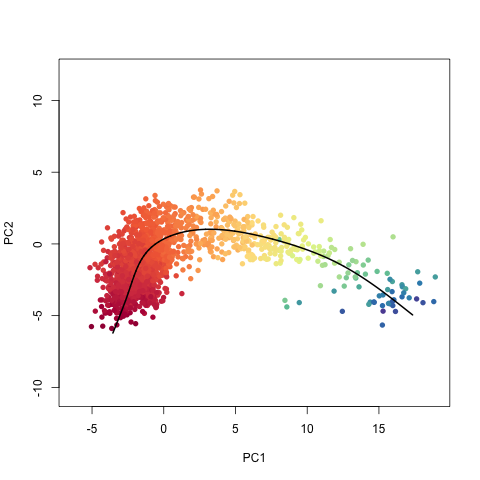

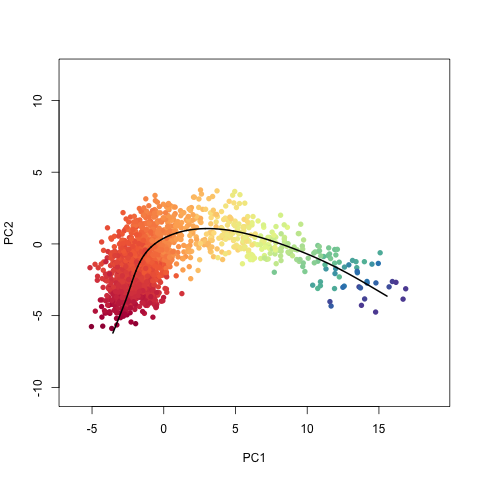

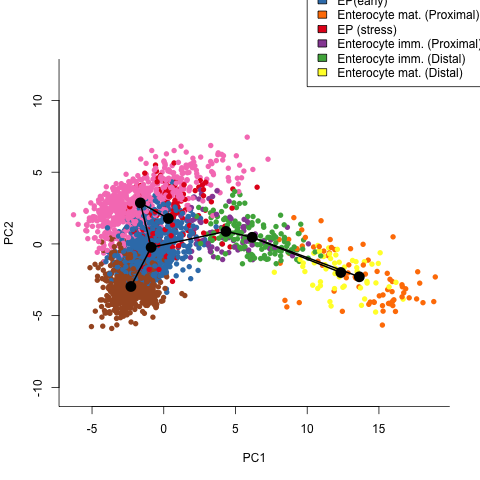

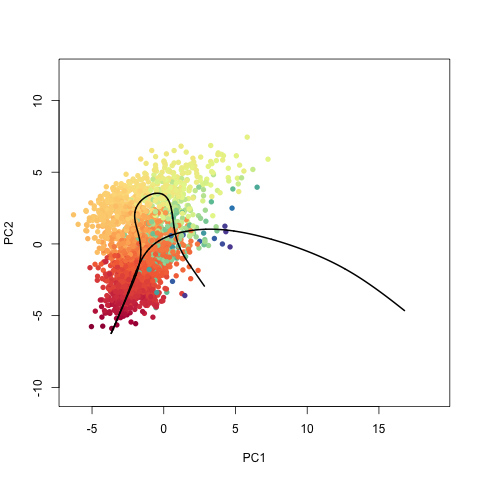

In [66]:
%%R

#Plot of lineage 1
colors <- colorRampPalette(brewer.pal(11,'Spectral')[-6])(100)
plot(reducedDims(adata_ent_startend)$PCA[,c(1,2)], col = colors[cut(adata_ent_startend$slingPseudotime_1,breaks=100)], pch=16, asp = 1, xlab='PC1', ylab='PC2')
lines(slingCurves(adata_ent_startend)$curve1, lwd=2)

#Plot of lineage 2
colors <- colorRampPalette(brewer.pal(11,'Spectral')[-6])(100)
plot(reducedDims(adata_ent_startend)$PCA[,c(1,2)], col = colors[cut(adata_ent_startend$slingPseudotime_2,breaks=100)], pch=16, asp = 1, xlab='PC1', ylab='PC2')
lines(slingCurves(adata_ent_startend)$curve2, lwd=2)

#Plot of lineages with clusters visualized
par(xpd=TRUE)
plot(reducedDims(adata_ent_startend)$PCA[,c(1,2)], col = brewer.pal(11,'Set1')[adata_ent$louvain_final], pch=16, asp = 1, bty='L', xlab='PC1', ylab='PC2')
lines(SlingshotDataSet(adata_ent_startend), lwd=2, type='lineages')
legend(x=10, y=20, legend=unique(colData(adata_ent)$louvain_final), fill=brewer.pal(11,'Set1')[as.integer(unique(colData(adata_ent)$louvain_final))])

#Plot of simpler clustering
plot(reducedDims(adata_ent_simple_startend)$PCA[,c(1,2)], col = colors[cut(adata_ent_simple_startend$slingPseudotime_1,breaks=100)], pch=16, asp = 1, xlab='PC1', ylab='PC2')
lines(SlingshotDataSet(adata_ent_simple_startend), lwd=2)

### 3.5.2 Non-batch-corrected slingshot

In [67]:
#Subsetting data set - non-batch corrected
cell_mask = np.isin(adata_combat.obs['louvain_final'], clusters_to_include)
adata_ent_nbc = sc.AnnData(X = adata_combat.raw.X[cell_mask,:])
adata_ent_nbc.obs = adata_combat.obs[cell_mask]
adata_ent_nbc.var = adata_combat.var.copy()

#Subset to highly variable genes
sc.pp.highly_variable_genes(adata_ent_nbc, flavor='cell_ranger', n_top_genes=4000, subset=True)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:02)


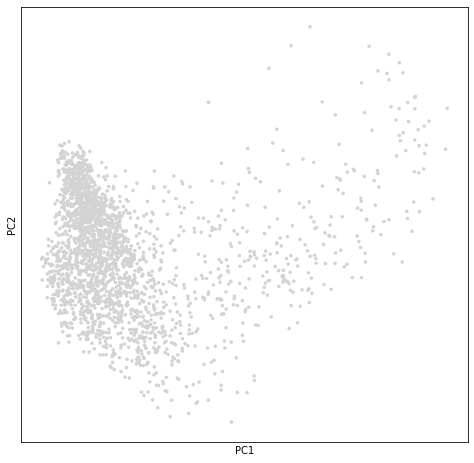

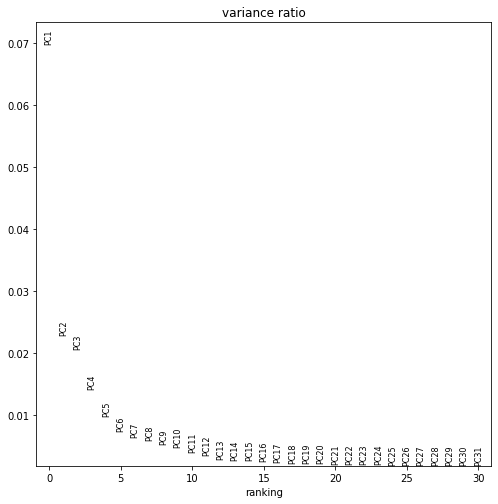

In [68]:
#Recalculating PCA for subset
sc.pp.pca(adata_ent_nbc, svd_solver='arpack')
sc.pl.pca(adata_ent_nbc)
sc.pl.pca_variance_ratio(adata_ent_nbc)

In [69]:
adata_ent_nbc.obsm['X_pca'] = adata_ent_nbc.obsm['X_pca'][:,0:7]

[1] "1:"
class: SlingshotDataSet 

 Samples Dimensions
    2371          7

lineages: 2 
Lineage1: Stem  EP(early)  Enterocyte imm. (Proximal)  Enterocyte mat. (Proximal)  Enterocyte mat. (Distal)  Enterocyte imm. (Distal)  
Lineage2: Stem  EP(early)  TA  EP (stress)  

curves: 2 
Curve1: Length: 46.965	Samples: 1555.68
Curve2: Length: 28.529	Samples: 1976.17
[1] ""
[1] "2:"
class: SlingshotDataSet 

 Samples Dimensions
    2371          7

lineages: 3 
Lineage1: Stem  EP(early)  Enterocyte imm. (Proximal)  Enterocyte imm. (Distal)  Enterocyte mat. (Distal)  
Lineage2: Stem  EP(early)  Enterocyte imm. (Proximal)  Enterocyte mat. (Proximal)  
Lineage3: Stem  EP(early)  TA  EP (stress)  

curves: 3 
Curve1: Length: 35.671	Samples: 1403.92
Curve2: Length: 38.088	Samples: 1271.25
Curve3: Length: 24.073	Samples: 1955.59
[1] ""
[1] "3:"
class: SlingshotDataSet 

 Samples Dimensions
    2371          7

lineages: 2 
Lineage1: Stem  EP(early)  TA  EP (stress)  
Lineage2: Stem  EP(early)  Enter

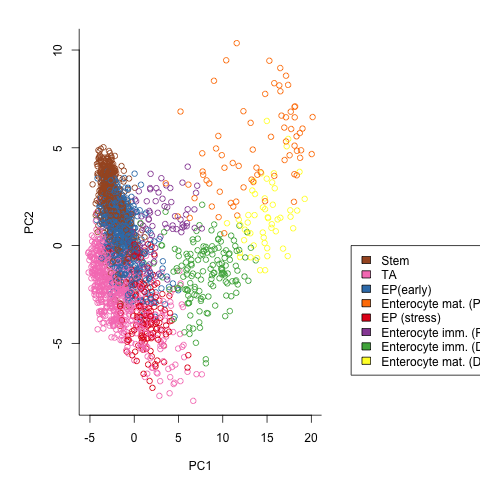

In [70]:
%%R -i adata_ent_nbc

#Plot 1
colour_map = brewer.pal(20,'Set1')
par(xpd=TRUE)
par(mar=c(4.5,5.5,2,11))
plot(reducedDims(adata_ent_nbc)$PCA[,1], reducedDims(adata_ent_nbc)$PCA[,2], col=colour_map[colData(adata_ent_nbc)$louvain_final], bty='L', xlab='PC1', ylab='PC2')
legend(x=24.5, y=0, legend=unique(colData(adata_ent_nbc)$louvain_final), fill=colour_map[as.integer(unique(colData(adata_ent_nbc)$louvain_final))])

#First trajectory: only Stem cells set as root cells
print("1:")
adata_ent_start_nbc <- slingshot(adata_ent_nbc, clusterLabels = 'louvain_final', reducedDim = 'PCA', start.clus='Stem')
print(SlingshotDataSet(adata_ent_start_nbc))

#Second trajectory: Stem cells as root cells and mature enterocytes as end clusters
print("")
print("2:")
adata_ent_startend_nbc <- slingshot(adata_ent_nbc, clusterLabels = 'louvain_final', reducedDim = 'PCA', start.clus='Stem', end.clus=c('Enterocyte mat. (Proximal)', 'Enterocyte mat. (Distal)'))
print(SlingshotDataSet(adata_ent_startend_nbc))

#Third trajectory: Stem cells as root cells and enterocytes as end cluster, non-subclustered data
print("")
print("3:")
adata_ent_simple_startend_nbc <- slingshot(adata_ent_nbc, clusterLabels = 'louvain_r0.65', reducedDim = 'PCA', start.clus='Stem', end.clus='Enterocyte')
print(SlingshotDataSet(adata_ent_simple_startend_nbc))

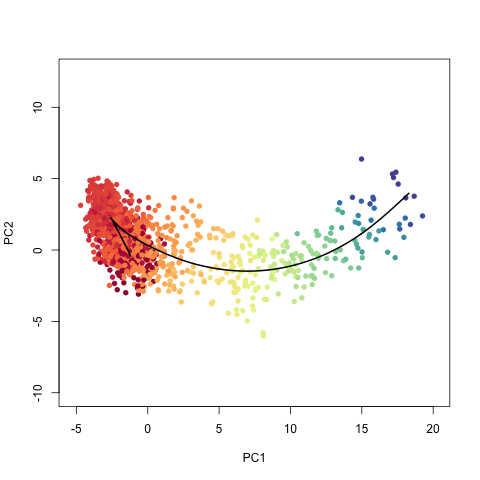

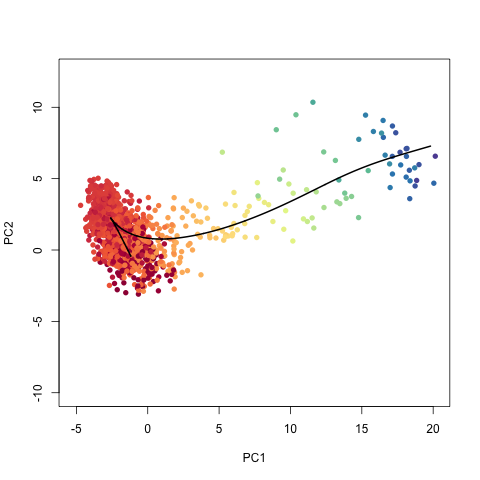

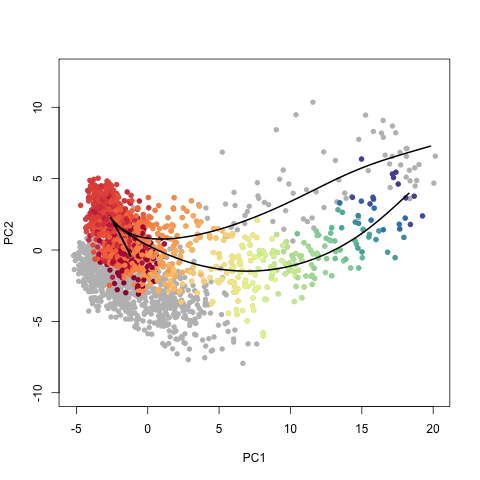

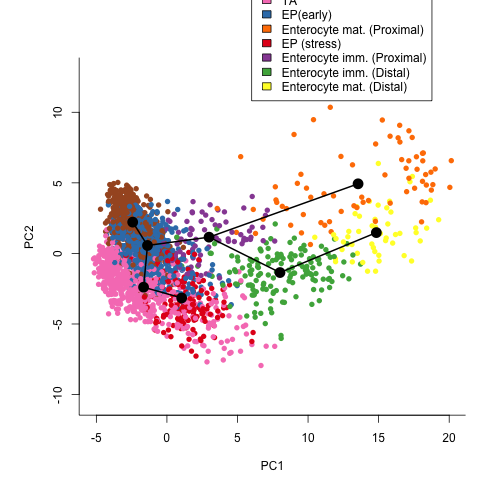

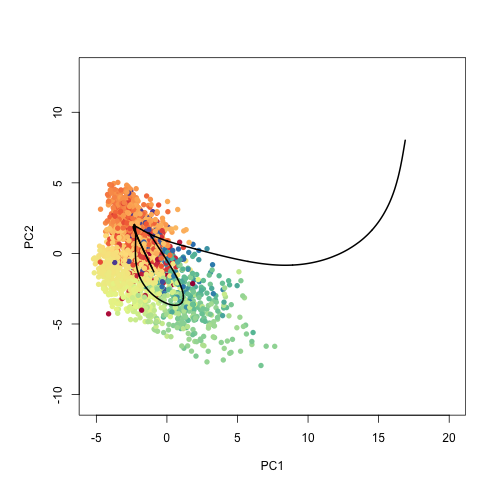

In [71]:
%%R

colors <- colorRampPalette(brewer.pal(11,'Spectral')[-6])(100)

#Plot of lineage 1
plot(reducedDims(adata_ent_startend_nbc)$PCA[,c(1,2)], 
     col = colors[cut(adata_ent_startend_nbc$slingPseudotime_1,breaks=100)], 
     pch=16, asp = 1, xlab='PC1', ylab='PC2')
lines(slingCurves(adata_ent_startend_nbc)$curve1, lwd=2)

#Plot of lineage 2
plot(reducedDims(adata_ent_startend_nbc)$PCA[,c(1,2)], 
     col = colors[cut(adata_ent_startend_nbc$slingPseudotime_2,breaks=100)], 
     pch=16, asp = 1, xlab='PC1', ylab='PC2')
lines(slingCurves(adata_ent_startend_nbc)$curve2, lwd=2)

#Combined plot
plot(reducedDims(adata_ent_startend_nbc)$PCA[,c(1,2)], col = 'grey', 
     pch=16, asp = 1, size=0.8, xlab='PC1', ylab='PC2')
points(reducedDims(adata_ent_startend_nbc)$PCA[,c(1,2)], 
       col = colors[cut(adata_ent_startend_nbc$slingPseudotime_1,breaks=100)], 
       pch=16, size=1)
lines(slingCurves(adata_ent_startend_nbc)$curve1, lwd=2)
lines(slingCurves(adata_ent_startend_nbc)$curve2, lwd=2)

#Plot of lineages with clusters visualized
par(xpd=TRUE)
par(mar=c(4.5,5.5,4,1))
plot(reducedDims(adata_ent_startend_nbc)$PCA[,c(1,2)], 
     col = brewer.pal(11,'Set1')[adata_ent_startend_nbc$louvain_final], 
     pch=16, asp = 1, bty='L', xlab='PC1', ylab='PC2')
lines(SlingshotDataSet(adata_ent_startend_nbc), lwd=2, type='lineages')
legend(x=6, y=20, legend=unique(colData(adata_ent_nbc)$louvain_final), fill=brewer.pal(11,'Set1')[as.integer(unique(colData(adata_ent_nbc)$louvain_final))])

#Plot of simpler clustering
plot(reducedDims(adata_ent_simple_startend_nbc)$PCA[,c(1,2)], 
     col = colors[cut(adata_ent_simple_startend_nbc$slingPseudotime_1,breaks=100)], 
     pch=16, asp = 1, xlab='PC1', ylab='PC2')
lines(SlingshotDataSet(adata_ent_simple_startend_nbc), lwd=2)

### 3.5.3 Monocle2

In [72]:
#Preprocessing for monocle
data_mat_mon = adata_combat.layers['counts'].T
var_mon=adata_combat.var.copy()
obs_mon=adata_combat.obs.copy()

In [73]:
%%R -i data_mat_mon -i obs_mon -i var_mon

#Set up the CellDataSet data structure
pd <- AnnotatedDataFrame(data = obs_mon)
fd <- AnnotatedDataFrame(data = var_mon)
colnames(data_mat_mon) <- rownames(pd)
rownames(data_mat_mon) <- rownames(fd)
ie_regions_cds <- newCellDataSet(cellData=data_mat_mon, phenoData=pd, featureData=fd, expressionFamily=negbinomial.size())

#Normalize the count data
ie_regions_cds <- estimateSizeFactors(ie_regions_cds)

#Calculate dispersions to filter for highly variable genes
ie_regions_cds <- estimateDispersions(ie_regions_cds)


#Filter for Stem, EP, TA, and Enterocytes
cell_types = as.character(pData(ie_regions_cds)$louvain_final)
cell_mask = rep(FALSE, length(cell_types))
cells_to_keep = c("Stem", "EP", "TA", "Enterocyte")
for (item in cells_to_keep) {cell_mask = cell_mask | startsWith(cell_types, item)}
print("Number of cells after filtering:")
print(sum(cell_mask))
print("")

#Filter highly variable genes from our analysis
hvg_mask = fData(ie_regions_cds)$highly_variable
ie_regions_cds <- ie_regions_cds[hvg_mask, cell_mask]

#Do dimensionality reduction
ie_regions_cds <- reduceDimension(ie_regions_cds, norm_method = 'vstExprs', reduction_method='DDRTree', verbose = F, max_components = 7)

#Run for the first time to get the ordering
ie_regions_cds <- orderCells(ie_regions_cds)

#Find the correct root state the corresponds to the 'Stem' cluster
tab1 <- table(pData(ie_regions_cds)$State, pData(ie_regions_cds)$louvain_final)
id = which(colnames(tab1) == 'Stem')
root_name = names(which.max(tab1[,id]))

#Run a second time to get the correct root state that overlaps with Stem cells
ie_regions_cds <- orderCells(ie_regions_cds, root_state=root_name)

[1] "Number of cells after filtering:"
[1] 2371
[1] ""


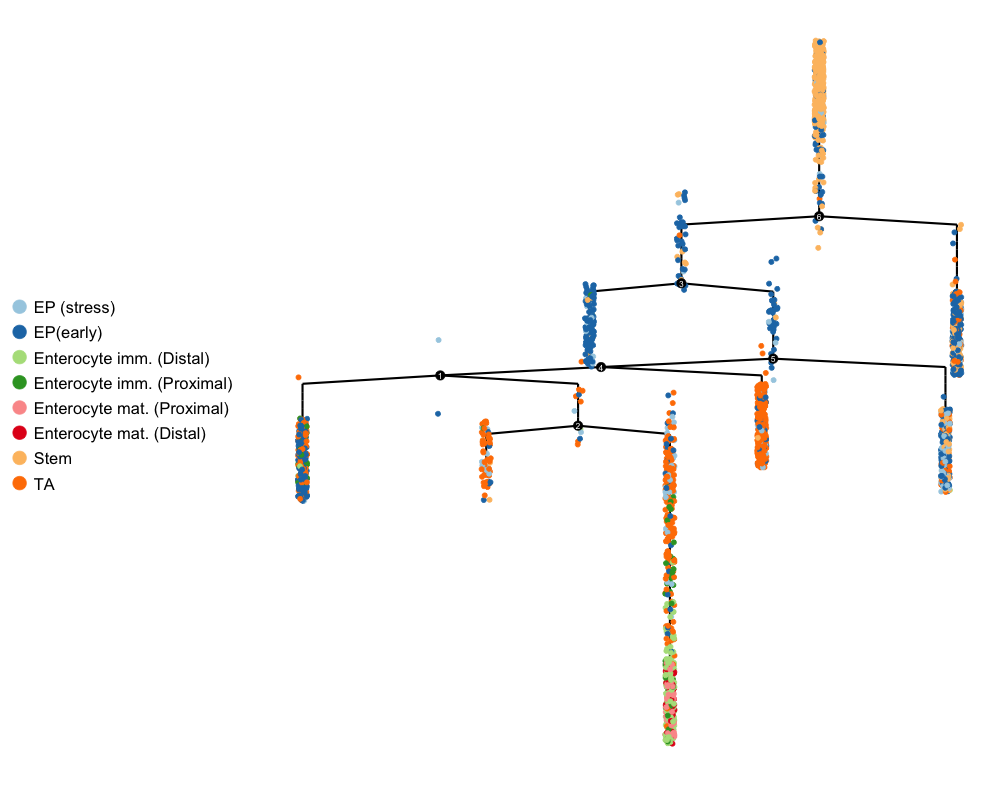

In [74]:
%%R -w 1000 -h 800

#Get a nice colour map
custom_colour_map = brewer.pal(length(unique(pData(ie_regions_cds)$louvain_final)),'Paired')

#Find the correct root state that coresponds to the 'Stem' cluster
tab1 <- table(pData(ie_regions_cds)$State, pData(ie_regions_cds)$louvain_final)
id = which(colnames(tab1) == 'Stem')
root_name = names(which.max(tab1[,id]))

# Visualize with our cluster labels
options(repr.plot.width=5, repr.plot.height=4)
plot_complex_cell_trajectory(ie_regions_cds, color_by = 'louvain_final', show_branch_points = T, 
                             cell_size = 2, cell_link_size = 1, root_states = c(root_name)) +
scale_size(range = c(0.2, 0.2)) +
theme(legend.position="left", legend.title=element_blank(), legend.text=element_text(size=rel(1.5))) +
guides(colour = guide_legend(override.aes = list(size=6))) + 
scale_color_manual(values = custom_colour_map)


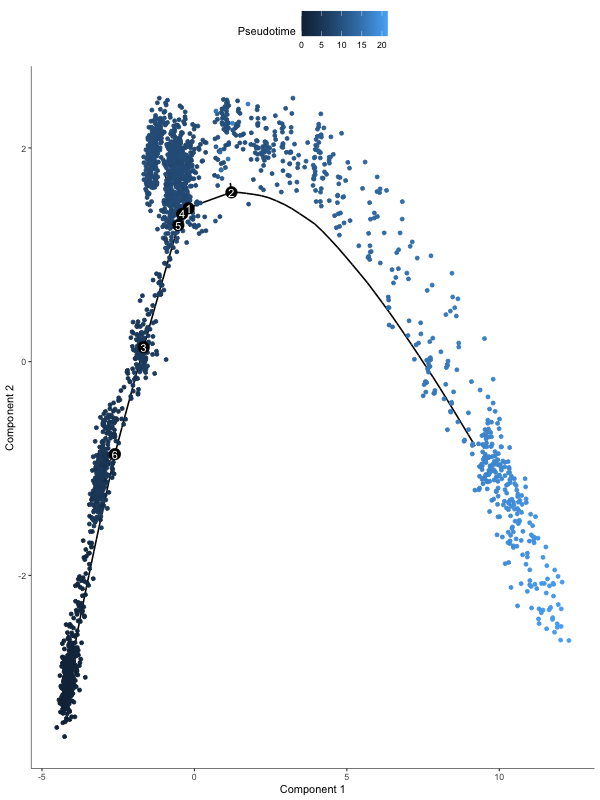

In [75]:
%%R -w 600 -h 800

#Visualize pseudotime found
options(repr.plot.width=5, repr.plot.height=4)
plot_cell_trajectory(ie_regions_cds, color_by="Pseudotime")

### 3.5.4 Diffusion Pseudotime (DPT)

In [76]:
sc.pp.neighbors(adata_ent)
sc.tl.diffmap(adata_ent)

computing neighbors
    using 'X_pca' with n_pcs = 7
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99276894 0.97862035 0.9721473  0.95784014 0.9408368
     0.93702453 0.93049115 0.9230209  0.90977544 0.9076252  0.90603745
     0.89755285 0.89461553 0.8926748 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)


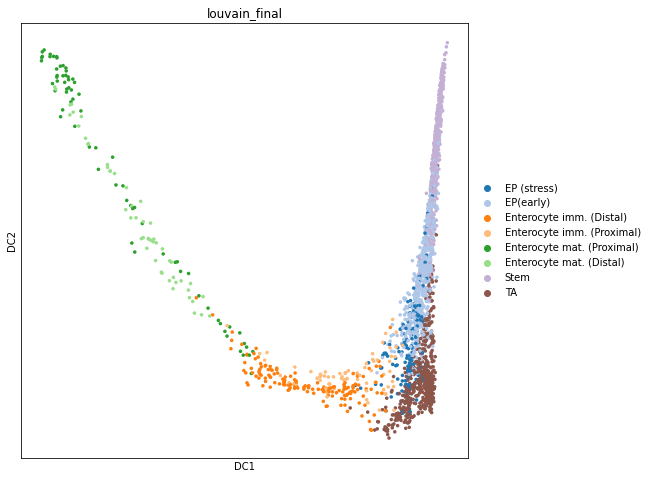

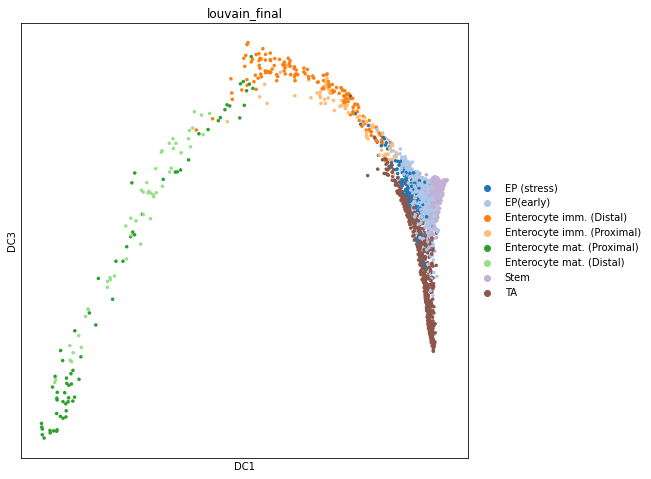

In [77]:
sc.pl.diffmap(adata_ent, components='1,2', color='louvain_final')
sc.pl.diffmap(adata_ent, components='1,3', color='louvain_final')

In [78]:
#Find the stem cell with the highest DC3 value to act as root for the diffusion pseudotime and compute DPT
stem_mask = np.isin(adata_ent.obs['louvain_final'], 'Stem')
max_stem_id = np.argmin(adata_ent.obsm['X_diffmap'][stem_mask,3])
root_id = np.arange(len(stem_mask))[stem_mask][max_stem_id]
adata_ent.uns['iroot'] = root_id

#Compute dpt
sc.tl.dpt(adata_ent)

computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


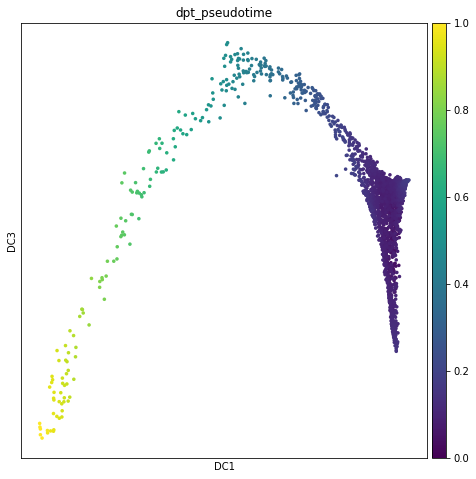

In [79]:
#Visualize pseudotime over differentiation
sc.pl.diffmap(adata_ent, components='1,3', color='dpt_pseudotime')

## 3.6 Gene expression dynamics

In [80]:
%%R

#Set the pseudotime variable
t <- adata_ent_simple_startend$slingPseudotime_1

#Extract the gene expression matrix
Y <- assay(adata_ent_simple_startend)

# fit a GAM with a loess term for pseudotime
#Note: This takes a while
gam.pval <- apply(Y,1,function(z){
  d <- data.frame(z=z, t=t)
  tmp <- gam(z ~ lo(t), data=d)
  p <- summary(tmp)[4][[1]][1,5]
  p
})

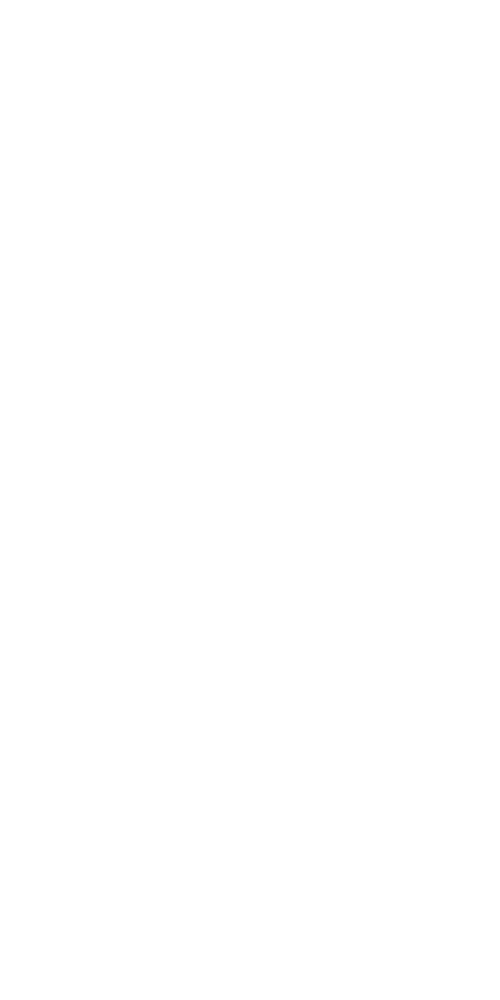

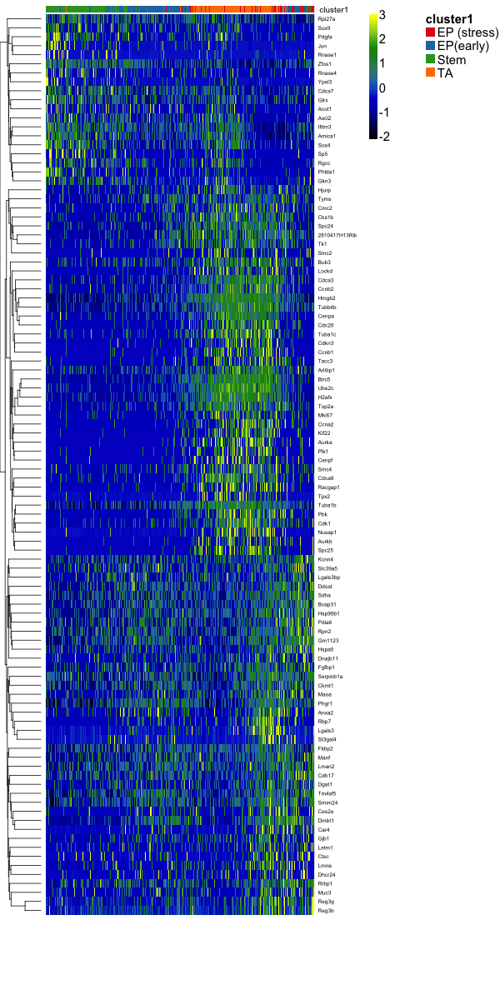

In [81]:
%%R -w 600 -h 1200

#Select the top 100 most significant genes that change over pseudotime
topgenes <- names(sort(gam.pval, decreasing = FALSE))[1:100]
heatdata <- assay(adata_ent_simple_startend)[rownames(assay(adata_ent_simple_startend)) %in% topgenes, 
                        order(t, na.last = NA)]

#Scale the data per gene for visualization
heatdata <- t(scale(t(heatdata)))

#Trimm z-score scale
heatdata[heatdata > 3] = 3
heatdata[heatdata < -3] = -3

#Get cluster assignment
heatclus <- adata_ent_simple_startend$louvain_r0.65[order(t, na.last = NA)]

#Set up a clusterExperiment data structure for heatmap visualization
ce <- ClusterExperiment(heatdata, heatclus, transformation = function(x){x})

#Plot the heatmap
plotHeatmap(ce, clusterSamplesData = "orderSamplesValue", visualizeData = 'transformed', fontsize=15)

In [82]:
entero_markers = marker_genes['Enterocyte (Proximal)'] + marker_genes['Enterocyte (Distal)']

In [83]:
%%R -i entero_markers
print(rownames(heatdata)[rownames(heatdata) %in% entero_markers])

[1] "Phgr1"  "Ckmt1"  "Dhcr24" "Muc3"   "Anxa2" 


## 3.7 Metastable states

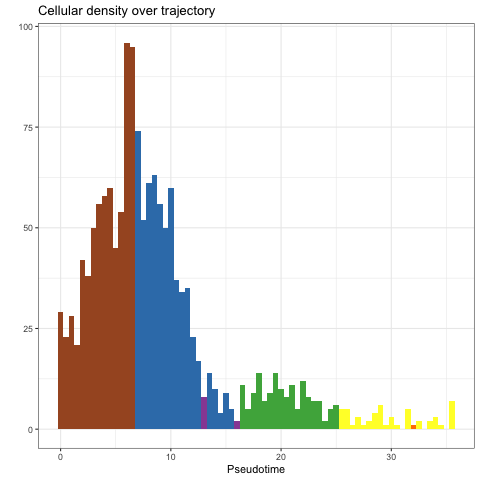

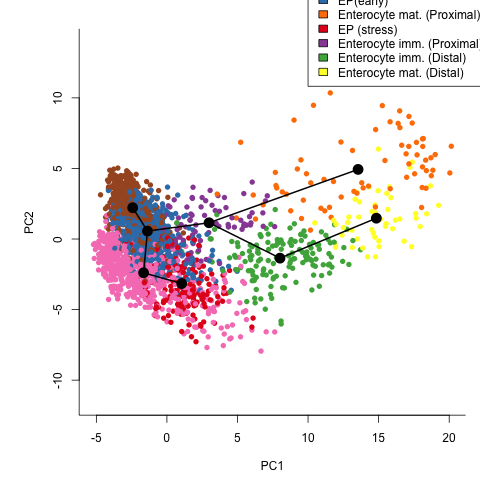

In [84]:
%%R

pt1 <- adata_ent_startend_nbc$slingPseudotime_1
clustDat <- adata_ent_startend_nbc$louvain_final

#Subset data to only include cells on lineage 1
clustDat <- clustDat[!is.na(pt1)]
pt1 <- pt1[!is.na(pt1)]
df = data.frame(clusters = clustDat, pt = pt1)

#Bin clusters in same way as pseudotime:
bin_width = 0.5
max_bin = ceiling(max(df$pt)*2)/2
df['bins'] = cut(df$pt, breaks=seq(-bin_width/2, max_bin, bin_width))

#Find dominant cluster in each bin
Mode <- function(x) {
  ux <- unique(x)
  ux[which.max(tabulate(match(x, ux)))]
}

dominant_clusters = sapply(levels(df$bins), function(x){Mode(df$clust[df$bins==x])})
levels(dominant_clusters) <- c(levels(dominant_clusters), 'None')
dominant_clusters[is.na(dominant_clusters)] <- 'None'

#Define colour map
cmap <- brewer.pal(11,'Set1')

#Plot meta-stable states
p <- qplot(adata_ent_startend_nbc$slingPseudotime_1, geom='histogram', main='Cellular density over trajectory', xlab='Pseudotime', binwidth=bin_width, fill=I(cmap[dominant_clusters])) +
theme_bw() +
scale_colour_manual(name="Cluster", values=c('EP (Distal)'=cmap[levels(dominant_clusters)[1]], 'EP (early)'=cmap[levels(dominant_clusters)[2]], EP_early="purple"))
print(p)

#Plot of lineages with clusters visualized
par(xpd=TRUE)
par(mar=c(4.5,5.5,2,1))
plot(reducedDims(adata_ent_startend_nbc)$PCA[,c(1,2)], col = brewer.pal(11,'Set1')[adata_ent$louvain_final], pch=16, asp = 1, bty='L', xlab='PC1', ylab='PC2')
lines(SlingshotDataSet(adata_ent_startend_nbc), lwd=2, type='lineages')
legend(x=10, y=20, legend=unique(colData(adata_ent)$louvain_final), fill=cmap[as.integer(unique(colData(adata_ent)$louvain_final))])

## 3.8 Partition-based graph abstraction

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


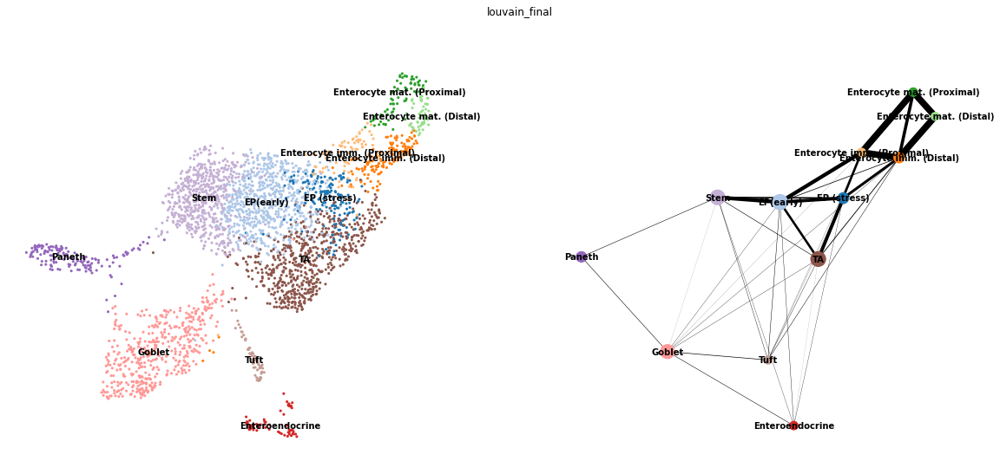

--> added 'pos', the PAGA positions (adata.uns['paga'])


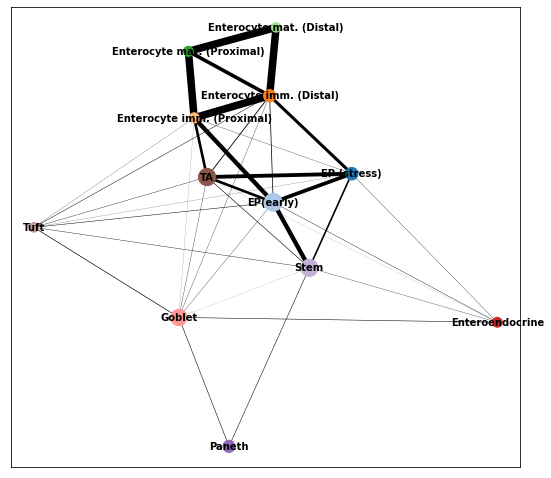

In [85]:
sc.tl.paga(adata_combat, groups='louvain_final')
sc.pl.paga_compare(adata_combat)
sc.pl.paga(adata_combat)

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


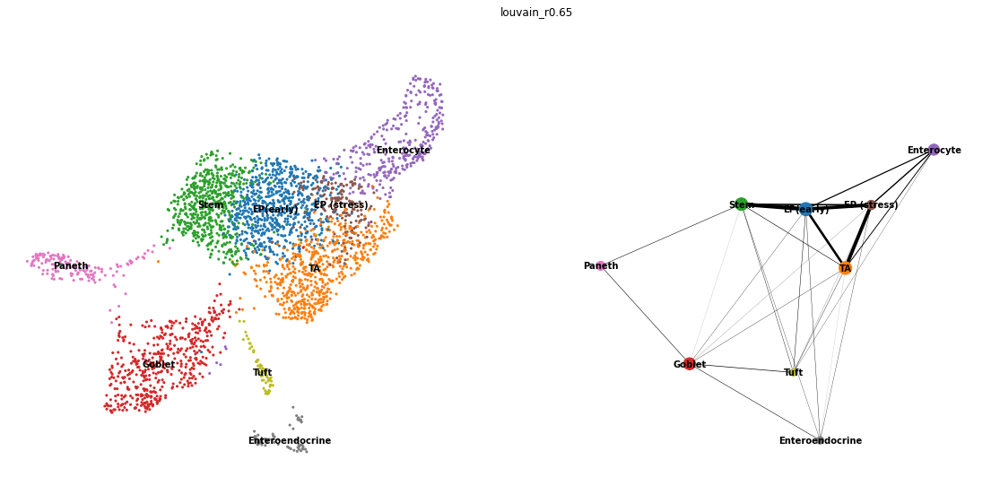

--> added 'pos', the PAGA positions (adata.uns['paga'])


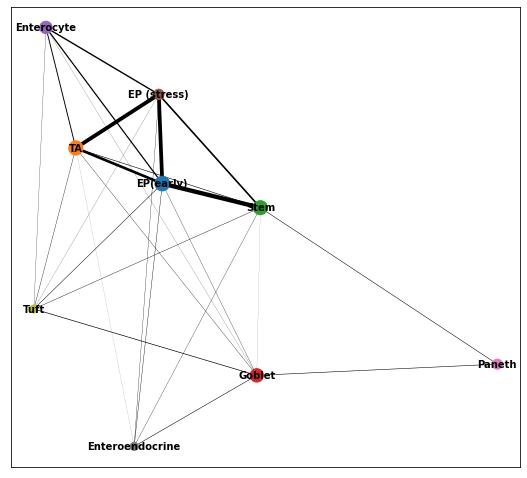

In [86]:
sc.tl.paga(adata_combat, groups='louvain_r0.65')
sc.pl.paga_compare(adata_combat)
sc.pl.paga(adata_combat)

--> added 'pos', the PAGA positions (adata.uns['paga'])


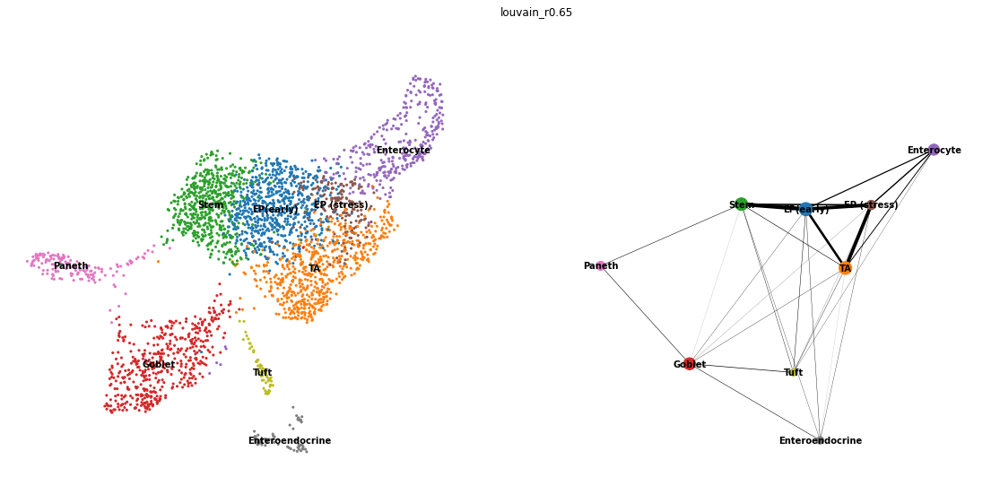

In [87]:
sc.pl.paga_compare(adata_combat, basis='umap')

--> added 'pos', the PAGA positions (adata.uns['paga'])


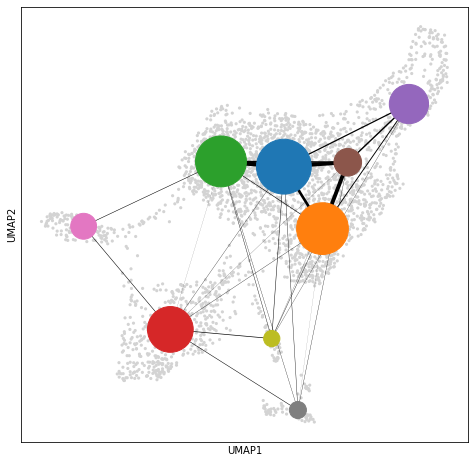

In [88]:
fig1, ax1 = plt.subplots()
sc.pl.umap(adata_combat, size=40, ax=ax1, show=False)
sc.pl.paga(adata_combat, pos=adata_combat.uns['paga']['pos'], show=False, node_size_scale=10, node_size_power=1, ax=ax1, text_kwds={'alpha':0})
#plt.savefig('./figures/umap_paga_overlay_gut.pdf', dpi=300, format='pdf')
plt.show()

filtered out 133 genes that are detected in less than 3 counts
regressing out n_counts
    finished (0:01:06)
    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


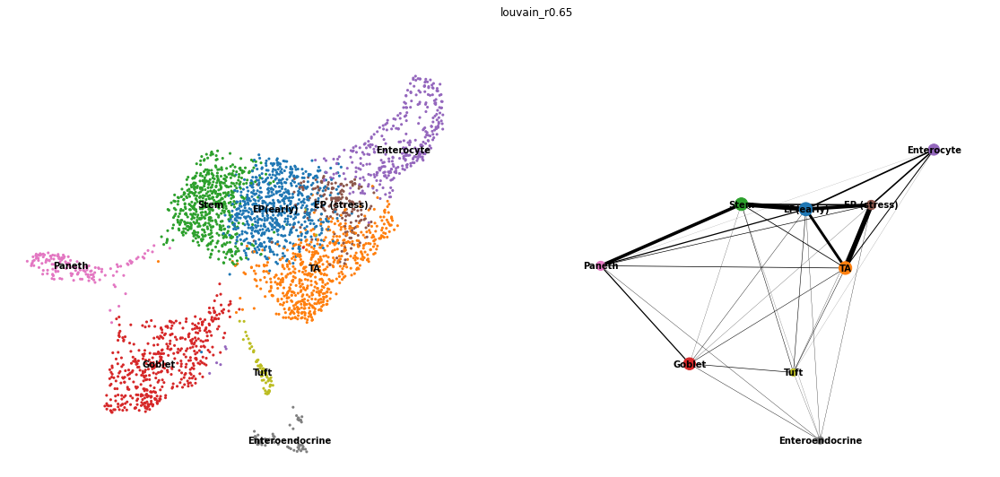

--> added 'pos', the PAGA positions (adata.uns['paga'])


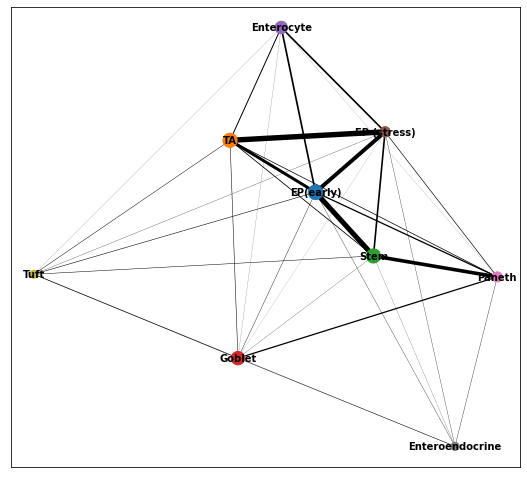

In [89]:
#Create new Anndata object with non-batch corrected data
adata_test = adata_combat.copy()
adata_test.X = adata_combat.raw.X
#Regress out counts and redo pre-processing

sc.pp.filter_genes(adata_test, min_counts=3)

sc.pp.regress_out(adata_test, 'n_counts')
sc.pp.pca(adata_test, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata_test)
#Recalculate PAGA
sc.tl.paga(adata_test, groups='louvain_r0.65')
sc.pl.paga_compare(adata_test, basis='umap')
sc.pl.paga(adata_test)

## 3.9 Gene-level analysis

### 3.9.1 Differential testing

The R program for gene-level analysis always crashes somehow... So gene-level analysis is not finished yet.

In [90]:
# save file
save_file = '/Users/xly/Desktop/study/python/adata_combat.h5ad'
#adata_combat.write_h5ad(save_file)

In [91]:
# read saved file
#adata_combat = sc.read_h5ad(save_file)